In [ ]:
!pip install torchmetrics
!pip install segmentation_models_pytorch
!pip install -U albumentations

In [ ]:
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from torchvision.transforms import CenterCrop
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn.functional as F
import torch.nn as nn
from tqdm.notebook import tqdm
from torchmetrics import JaccardIndex
from segmentation_models_pytorch.losses import DiceLoss, FocalLoss
from time import time
import gc
import pandas as pd

In [ ]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)

Подгрузка и разархивирование необходимых директорий с гугл диска.

In [ ]:
import gdown

In [ ]:
!gdown --id 1aswekfugAaXXUEA5jPZoSqvyFPv_PLzF
!unzip test.zip

In [ ]:
!gdown --id 1oxlMgr6C3jkb827iYrL2B6EPwa_ONoRu
!unzip train.zip

In [ ]:
BASE_DIR = Path('/content/') #/kaggle/working/
TRAIN_DIR = BASE_DIR.joinpath("train/")
TEST_DIR = BASE_DIR.joinpath("test/")
TRAIN_IMG_DIR = TRAIN_DIR.joinpath("images/")
TRAIN_GT_DIR = TRAIN_DIR.joinpath("gt/")
TEST_IMG_DIR = TEST_DIR.joinpath("images/")

# Загрузка датасета

Получим имена изображений для тренировочной выборки.

In [ ]:
train_val_subimg_files = sorted(list(TRAIN_IMG_DIR.rglob('*.png')))
train_val_subimg_labels = [path.name for path in train_val_subimg_files]

Поделим на тренировочную и валидационную части.

In [ ]:
from sklearn.model_selection import train_test_split

train_files, val_files = train_test_split(train_val_subimg_labels, test_size=0.20)

In [ ]:
DATA_MODES = ['train', 'val', 'test']
class GeodataDataset(Dataset):
    """
    Датасет для загрузки изображений и масок. Может загружать данные в трех
    режимах: 'train', 'val', 'test'. В режиме 'test' загружает только изображения
    без масок.
    """
    def __init__(self, files, img_path, mode, transforms, gt_path=None):
        super().__init__()

        self.files = sorted(files)
        self.mode = mode
        self.transforms = transforms

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)
        print(f'Found {self.len_} images for {self.mode} part')

        self.img_path = img_path
        if self.mode != 'test':
            self.gt_path = gt_path

    def __len__(self):
        return self.len_

    def load_sample(self, file, mode_gt=False):
        if mode_gt:
            image = Image.open(file).convert('L') #на случай, если маска трехканальная
        else:
            image = Image.open(file)
        return np.array(image)/255  #для использования albumentations

    def padded_image(self, image):
        """
        Добавляет зеркальные границы к изображению для получения размера 326x326.
        Это позволит лучше сегментировать пиксели на краях изображения.
        """
        (_, H, W) = image.shape
        pad_h = (326 - H) // 2
        pad_w = (326 - W) // 2
        image = F.pad(
            image,
            pad=(pad_w, pad_w, pad_h, pad_h),  # (left, right, top, bottom)
            mode='reflect'
        )
        return image

    def __getitem__(self, index):
        x = self.load_sample(self.img_path.joinpath(self.files[index]))
        if self.mode == 'test':
            transformed = self.transforms(image=x)
            x = transformed["image"]
            x = self.padded_image(x)
            return x
        y = self.load_sample(self.gt_path.joinpath(self.files[index]), mode_gt=True)
        transformed = self.transforms(image=x, mask=y)
        x = transformed["image"]
        x = self.padded_image(x)
        y = transformed["mask"].unsqueeze(0)
        return x, y


In [ ]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.1),
        A.Rotate(limit=(40,60),p=0.5),
        A.Normalize(mean=mean, std=std, max_pixel_value=1.0),
        ToTensorV2(),
    ]
)

test_transform = A.Compose(
    [
        A.Normalize(mean=mean, std=std, max_pixel_value=1.0),
        ToTensorV2(),
    ]
)

In [ ]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)

Found 10199 images for train part
Found 2550 images for val part


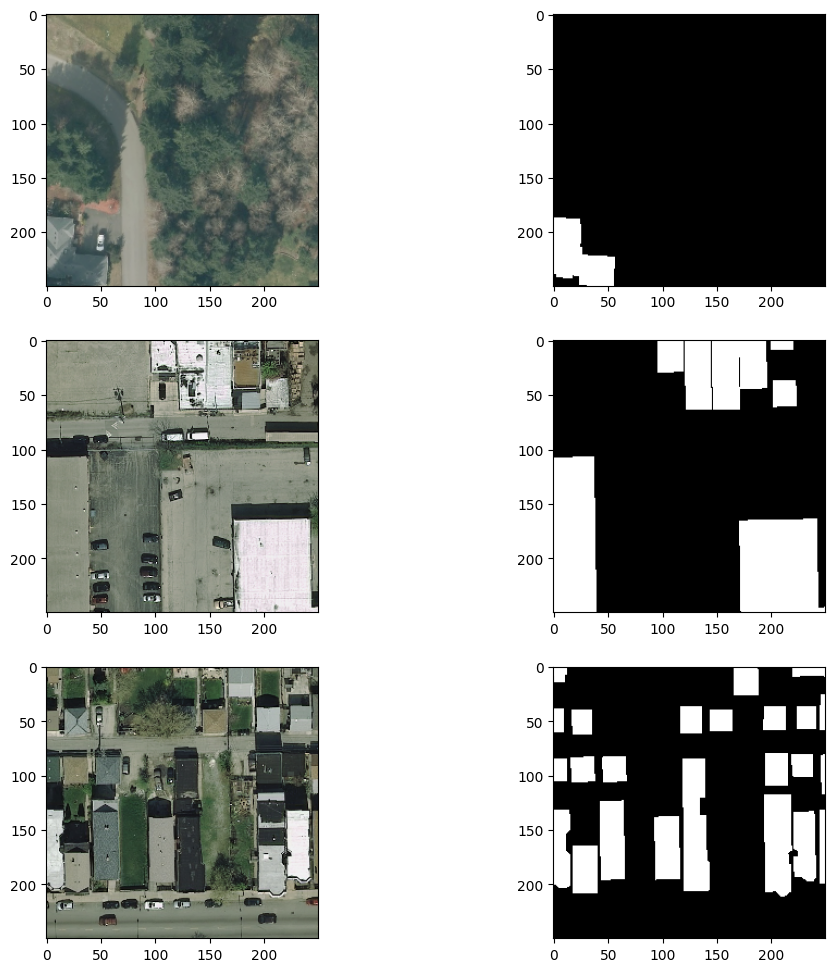

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=2,figsize=(10, 10))
for fig_x in ax:
    random_img = int(np.random.uniform(0,2550))
    img, gt = val_dataset[random_img]
    img = CenterCrop(size=[250, 250])(img)
    img = img.data.cpu().numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    gt = gt.data.cpu().numpy().transpose((1, 2, 0))
    fig_x[0].set_title("Image")
    fig_x[0].imshow(img)
    fig_x[1].set_title("GT mask")
    fig_x[1].imshow(gt, cmap='gray')

plt.tight_layout()
plt.show()

# Архитектура сети

In [ ]:
class ConvReLU(nn.Module):
    def __init__(self, in_c, out_c, kernel_size=3, padding=1) -> None:
        super(ConvReLU, self).__init__()
        self.conv = nn.Conv2d(in_c, out_c, kernel_size=kernel_size, padding=padding)
        self.bn = nn.BatchNorm2d(out_c)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

class EncoderBlockUnet(nn.Module):
    def __init__(self, in_c, out_c, depth=2, kernel_size=3, padding=[1,1,]) -> None:
        super(EncoderBlockUnet, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(depth):
            self.layers.append(ConvReLU(in_c if i == 0 else out_c, out_c, kernel_size, padding[i]))
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        x_copy = x
        x = self.pool(x)
        return x, x_copy

class DecoderBlockUnet(nn.Module):
    def __init__(self, in_c, out_c, depth=2, kernel_size=3, padding=[1,1,]) -> None:
        super(DecoderBlockUnet, self).__init__()
        self.unconv = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2)
        self.layers = nn.ModuleList()
        for i in range(depth):
            if i == 0:
                self.layers.append(ConvReLU(in_c, out_c, kernel_size=kernel_size, padding=padding[i]))
            else:
                self.layers.append(ConvReLU(out_c, out_c, kernel_size=kernel_size, padding=padding[i]))

    def forward(self, x, x_copy):
        x = self.unconv(x)
        (_, _, H, W) = x.shape
        x_crop = CenterCrop(size=[H, W])(x_copy)
        x = torch.cat((x, x_crop), dim=1)
        for layer in self.layers:
            x = layer(x)
        return x

На выходе сети будет тензор с логитами размера 250*250.

In [ ]:
class UNet(nn.Module):
    def __init__(self, input_img_size = 326, n_class=1):
        super().__init__()
        self.input_img_size = input_img_size
        # encoder
        self.encoder1 = EncoderBlockUnet(3, 64, padding=[0, 1])
        self.encoder2 = EncoderBlockUnet(64, 64*2, padding=[0, 1])
        self.encoder3 = EncoderBlockUnet(64*2, 64*4)
        self.encoder4 = EncoderBlockUnet(64*4, 64*8)
        # bottleneck
        self.bottleneck = nn.Sequential(
            ConvReLU(64*8, 64*16, padding=0),
            ConvReLU(64*16, 64*16, padding=0)
        )
        # decoder
        self.decoder1 = DecoderBlockUnet(64*16, 64*8)
        self.decoder2 = DecoderBlockUnet(64*8, 64*4)
        self.decoder3 = DecoderBlockUnet(64*4, 64*2, padding=[1, 0])
        self.decoder4 = DecoderBlockUnet(64*2, 64, padding=[1, 0])
        self.conv_last  = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        # encoder
        enc1_in = x
        enc2_in, enc1_out = self.encoder1(enc1_in)
        enc3_in, enc2_out = self.encoder2(enc2_in)
        enc4_in, enc3_out = self.encoder3(enc3_in)
        bottleneck_in, enc4_out = self.encoder4(enc4_in)
        # bottleneck
        bottleneck_out = self.bottleneck(bottleneck_in)
        # decoder
        dec1_out = self.decoder1(bottleneck_out, enc4_out)
        dec2_out = self.decoder2(dec1_out, enc3_out)
        dec3_out = self.decoder3(dec2_out, enc2_out)
        dec4_out = self.decoder4(dec3_out, enc1_out)

        output = self.conv_last(dec4_out)

        return output

# Метрики

In [ ]:
iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(DEVICE)

In [ ]:
def dice_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):

    prob_mask = logits.sigmoid()
    pred_mask = (prob_mask > threshold).float()

    tp = torch.sum(pred_mask*labels)
    fp = torch.sum(pred_mask) - tp
    fn = torch.sum(labels) - tp

    eps = 1e-8
    score = (2*tp + eps) / (2*tp + fp + fn + eps)

    return score

def precision_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):

    prob_mask = logits.sigmoid()
    pred_mask = (prob_mask > threshold).float()

    tp = torch.sum(pred_mask*labels)
    fp = torch.sum(pred_mask) - tp

    eps = 1e-8
    score = (tp + eps) / (tp + fp)

    return score

def recall_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):

    prob_mask = logits.sigmoid()
    pred_mask = (prob_mask > threshold).float()

    tp = torch.sum(pred_mask*labels)
    fn = torch.sum(labels) - tp

    eps = 1e-8
    score = (tp + eps) / (tp + fn + eps)

    return score

# Функции потерь

In [ ]:
class TverskyIndex(nn.Module):
    def __init__(self, alpha=0.3, betta = 0.7, eps = 1e-6):
        super(TverskyIndex, self).__init__()
        self.alpha = alpha
        self.betta = betta
        self.eps = eps

    def forward(self, y_pred, y_true):
        y_prob = y_pred.sigmoid()
        t_p = (y_true*y_prob).sum(dim=(1,2,3))
        f_p = (y_prob*(1-y_true)).sum(dim=(1,2,3))
        f_n = (y_true*(1-y_prob)).sum(dim=(1,2,3))
        ti = (t_p + self.eps)/(t_p + self.alpha*f_p + self.betta*f_n + self.eps)
        return ti

class FocalTverskyLoss(nn.Module):
    def __init__(self, gamma=4/3, alpha=0.3, betta=0.7, eps = 1e-6):
        super(FocalTverskyLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.betta = betta
        self.eps = eps
        self.TI = TverskyIndex(alpha=self.alpha, betta = self.betta, eps = self.eps)

    def forward(self, y_pred, y_true):
        ti = self.TI(y_pred, y_true)
        loss = torch.pow((1-ti), 1/self.gamma)
        return loss.mean()

In [ ]:
class ComboLoss(nn.Module):
    def __init__(self, alpha=0.5):
        super(ComboLoss, self).__init__()
        self.alpha = alpha
        self.bce_loss = nn.BCEWithLogitsLoss(reduction='mean').to(DEVICE)
        self.dice_loss = DiceLoss(mode='binary').to(DEVICE)

    def forward(self, y_pred, y_true):
        bce = self.bce_loss(y_pred, y_true)
        dice = self.dice_loss(y_pred, y_true)
        return self.alpha*bce + (1-self.alpha)*dice

class UnifiedFocalLoss(nn.Module):
    def __init__(self, delta=0.5, gamma=4/3, lamda=0.5):
        super(UnifiedFocalLoss, self).__init__()
        self.delta = delta
        self.gamma = gamma
        self.lamda = lamda
        self.focal_loss = FocalLoss(mode='binary', gamma=self.gamma).to(DEVICE)
        self.focal_tversky_loss = FocalTverskyLoss(gamma=self.gamma, alpha=self.delta, betta=(1-self.delta)).to(DEVICE)

    def forward(self, y_pred, y_true):
        focal = self.focal_loss(y_pred, y_true)
        focal_tversky = self.focal_tversky_loss(y_pred, y_true)
        return self.lamda*focal + (1-self.lamda)*focal_tversky

# Функции обучения

In [ ]:
def fit_epoch(model, data_loader, criterion, optimizer):
    model.train()
    common_loss = 0.0
    for img_batch, gt_batch in data_loader:
        img_batch = img_batch.to(DEVICE, non_blocking=True)
        gt_batch = gt_batch.to(DEVICE, non_blocking=True)
        outputs = model(img_batch)
        loss = criterion(outputs, gt_batch)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        common_loss += loss.item()

    train_loss = common_loss / len(data_loader)

    return train_loss

def eval_epoch(model, data_loader, criterion, plot=False):
    model.eval()
    common_loss = 0.0
    common_iou = 0.0

    for img_batch, gt_batch in data_loader:
        img_batch = img_batch.to(DEVICE, non_blocking=True)
        gt_batch = gt_batch.to(DEVICE, non_blocking=True)

        with torch.set_grad_enabled(False):
            outputs = model(img_batch)
            loss = criterion(outputs, gt_batch)
            iou = iou_score(outputs, gt_batch)

        common_loss += loss.item()
        common_iou += iou.item()

    eval_loss = common_loss / len(data_loader)
    eval_iou = common_iou / len(data_loader)

    if plot:
        (_, _, H, W) = outputs.shape
        orig_img = CenterCrop(size=[H, W])(img_batch[0])
        orig_img = orig_img.cpu().detach().numpy().transpose((1, 2, 0))
        orig_mask = gt_batch[0].cpu().detach().numpy().squeeze()
        pred_mask = outputs[0].cpu().detach().numpy().squeeze() > 0.5

        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        orig_img = std * orig_img + mean
        orig_img = np.clip(orig_img, 0, 1)

        fig, axes = plt.subplots(1, 3, figsize=(10, 8))
        axes[0].imshow(orig_img);
        axes[0].set_title("Оригинальное изображение")
        axes[1].imshow(orig_mask, cmap='gray')
        axes[1].set_title("Ground truth")
        axes[2].imshow(pred_mask, cmap='gray')
        axes[2].set_title(f"Предсказанная маска, iou = {'%.3f' % eval_iou}")
        plt.show()

    return eval_loss, eval_iou

В функцию train добавлена преждевременная остановка модели при переобучениии или в ситуации, когда качество перестает расти. Такжи сохранение истории внесено внутрь функции. (по сравнению с train в ноутбуке Experiments Pipeline)

In [ ]:
def train(model, train_loader, val_loader, epochs, criterion, optimizer, scheduler=None, ckpt_path=None, plot_loss=False):

    start_train_time = time()
    log_template = "\nEpoch: {ep:03d} train_loss: {t_loss:0.4f} eval_loss: {v_loss:0.4f} eval_iou: {v_iou:0.4f}"

    total_train_loss = []
    total_eval_loss = []
    total_eval_iou = []
    best_iou = 0.0
    patience_epoch = 5
    patience_counter = 0
    patience_counter_2 = 0

    with tqdm(desc="epoch", total=epochs) as pbar_outer:

        for epoch in range(epochs):
            train_loss = fit_epoch(model, train_loader, criterion, optimizer)
            eval_loss, eval_iou = eval_epoch(model, val_loader, criterion, plot=((epoch+1)%2 == 0 or (epoch+1)==epochs)) #вывод графиков каждую 10 эпоху и последнюю

            if scheduler is not None:
                scheduler.step(eval_loss)

            total_train_loss.append(train_loss)
            total_eval_loss.append(eval_loss)
            total_eval_iou.append(eval_iou)

            pbar_outer.update(1)
            tqdm.write(log_template.format(ep=epoch+1, t_loss=train_loss, v_loss=eval_loss, v_iou=eval_iou))

            if plot_loss and ((epoch+1)%2 == 0 or (epoch+1)==epochs):
                plt.figure(figsize=(6, 4))
                plt.plot(list(range(len(total_train_loss))), total_train_loss, label = 'train loss')
                plt.plot(list(range(len(total_eval_loss))), total_eval_loss, label = 'val loss')
                plt.title("Loss")
                plt.legend()
                plt.show()

            torch.cuda.empty_cache()
            gc.collect()

            if eval_iou > best_iou:
                best_iou = eval_iou
                patience_counter = 0
                torch.save({
                    'epoch': epoch+1,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict()
                    },f'{ckpt_path}/best_iou.pt')
            else:
                patience_counter += 1
                if patience_counter > patience_epoch:
                    print(f"Преждевременная остановка обучения на {epoch+1} эпохе, т.к. качество модели не увеличивается")
                    break

            if eval_loss > train_loss:
                patience_counter_2 += 1
                if patience_counter_2 > patience_epoch:
                    print(f"Преждевременная остановка обучения на {epoch+1} эпохе из-за переобучения")
                    break
            else:
                patience_counter_2 = 0


    stop_train_time = time() - start_train_time
    print(f'Training complete in {stop_train_time // 60:.0f}m {stop_train_time % 60:.0f}s')

    torch.save({
        'epoch': epoch+1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
        }, f'{ckpt_path}/last_epoch_val_iou.pt')

    history = {'train loss': total_train_loss,
               'val_loss': total_eval_loss,
               'val_iou': total_eval_iou}
    df_history = pd.DataFrame(history)
    df_history.to_csv((f'{ckpt_path}/history_train.csv'), index=False)

    return history

# Функции теста и предсказания для одного изображения

In [ ]:
def test(model, test_dataloader):

    model.eval()

    test_iou = 0.0
    test_dice = 0.0
    test_precision = 0.0
    test_recall = 0.0

    for X_batch, Y_batch in test_dataloader:
        X_batch = X_batch.to(DEVICE)
        Y_batch = Y_batch.to(DEVICE)

        with torch.set_grad_enabled(False):
            outputs = model(X_batch)
            iou = iou_score(outputs, Y_batch)
            dice = dice_score(outputs, Y_batch)
            precision = precision_score(outputs, Y_batch)
            recall = recall_score(outputs, Y_batch)


        test_iou += iou.item()
        test_dice += dice.item()
        test_precision += precision.item()
        test_recall += recall.item()

    test_iou = test_iou / len(test_dataloader)
    test_dice = test_dice / len(test_dataloader)
    test_precision = test_precision / len(test_dataloader)
    test_recall = test_recall / len(test_dataloader)

    return test_iou, test_dice, test_precision, test_recall

In [ ]:
def predict_one(model, inputs):
    model.eval()

    with torch.set_grad_enabled(False):
        inputs = inputs.to(DEVICE)
        outputs = model(inputs).cpu().detach().numpy().squeeze()
        mask = outputs > 0.5
    return mask

# Процесс обучения

Все обученные модели и истории обучения сохраняются в сессионное хранилище. После окончания обучения рекомендуется сразу сохранить их на локальный компьютер или гугл диск. Т.к. если сессия прервется, данные будут утеряны, а обучение длится долго. После обучения все будет подгружаться с гугл диска. Все файлы будут доступны. Но, чтобы подгрузить свои, необходимо поменять id в url. Инструкцию, как подгрузить файлы с гугл диска, можно посмотреть [здесь](https://www.kaggle.com/code/vignesh369/how-to-access-google-drive-contents-in-kaggle) .

## Эксперимент v1

16 эпох. Unified Focal Loss при delta=0.45. Начальный lr=1e-3 и bs=4.

In [ ]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)
batch_size = 4
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True, persistent_workers=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)

Found 10199 images for train part
Found 2550 images for val part


In [ ]:
unified_focal_loss_4 = UnifiedFocalLoss(delta=0.45)

epoch:   0%|          | 0/20 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.4202 eval_loss: 0.3965 eval_iou: 0.4686


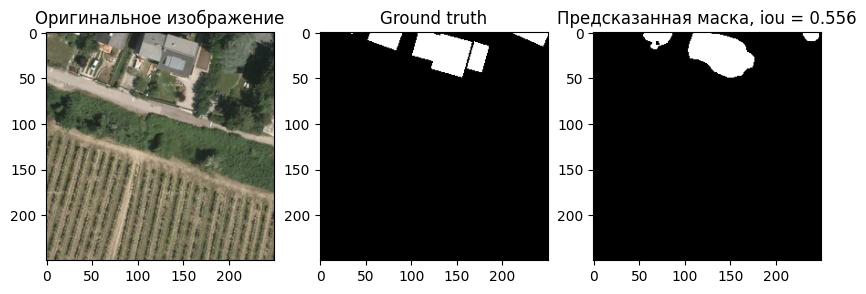


Epoch: 002 train_loss: 0.3801 eval_loss: 0.3390 eval_iou: 0.5559


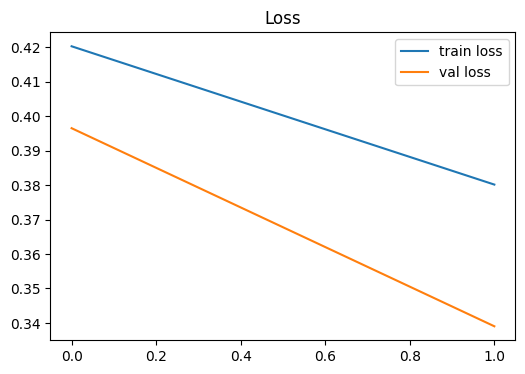


Epoch: 003 train_loss: 0.3479 eval_loss: 0.3267 eval_iou: 0.5855


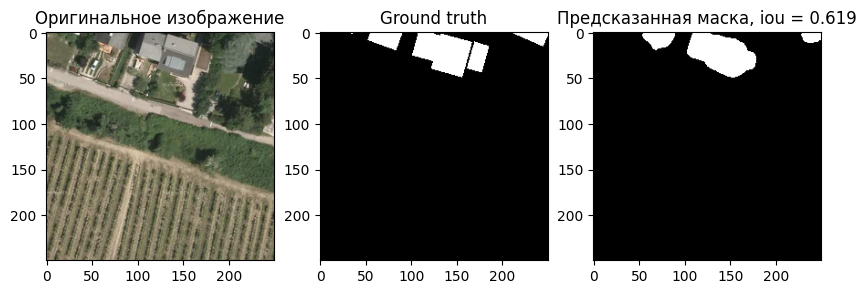


Epoch: 004 train_loss: 0.3288 eval_loss: 0.3031 eval_iou: 0.6188


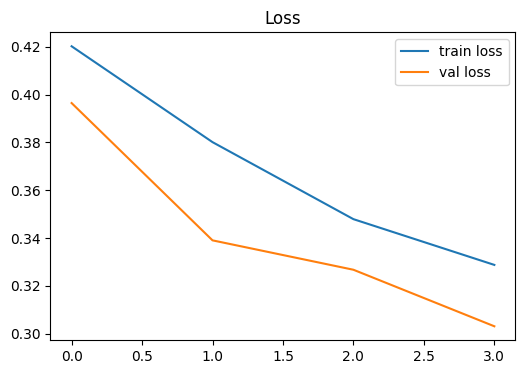


Epoch: 005 train_loss: 0.3131 eval_loss: 0.2946 eval_iou: 0.6314


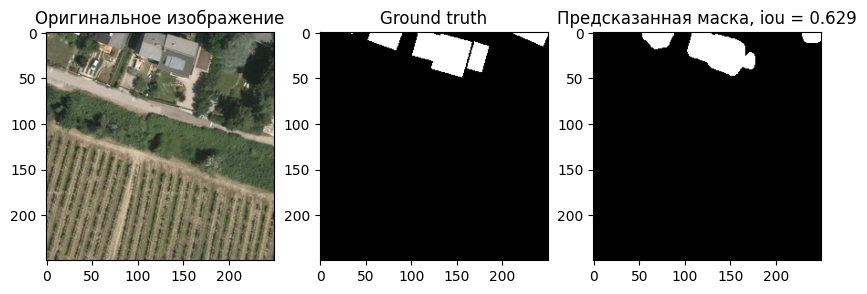


Epoch: 006 train_loss: 0.3053 eval_loss: 0.2934 eval_iou: 0.6289


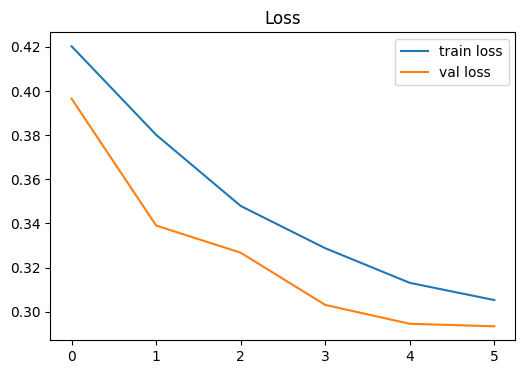


Epoch: 007 train_loss: 0.2975 eval_loss: 0.2740 eval_iou: 0.6617


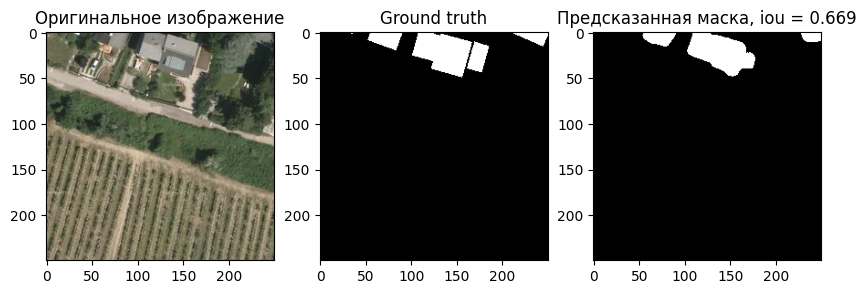


Epoch: 008 train_loss: 0.2888 eval_loss: 0.2720 eval_iou: 0.6693


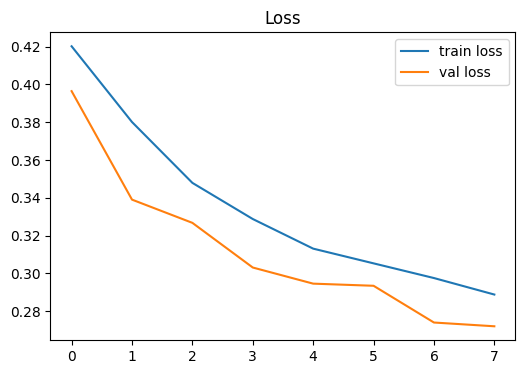


Epoch: 009 train_loss: 0.2841 eval_loss: 0.2725 eval_iou: 0.6648


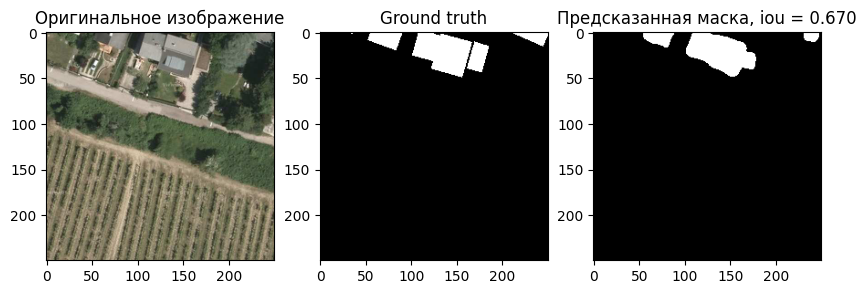


Epoch: 010 train_loss: 0.2783 eval_loss: 0.2724 eval_iou: 0.6698


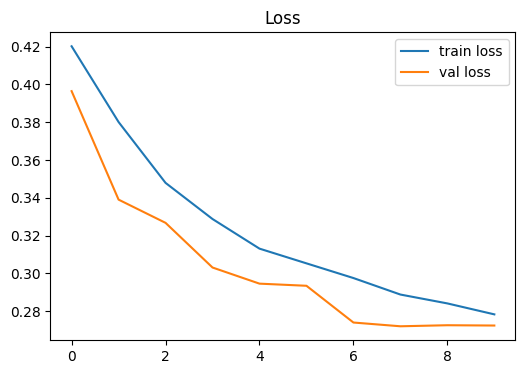


Epoch: 011 train_loss: 0.2756 eval_loss: 0.2634 eval_iou: 0.6779


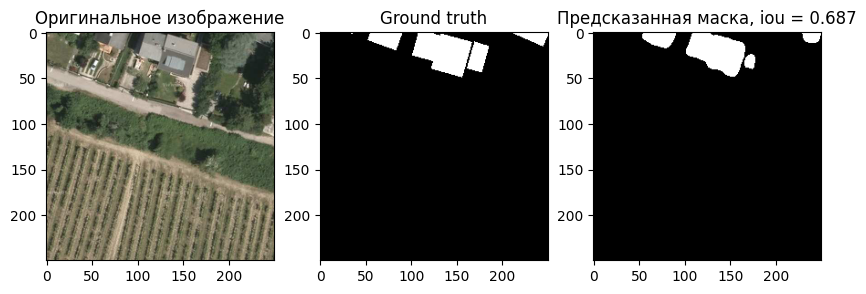


Epoch: 012 train_loss: 0.2692 eval_loss: 0.2557 eval_iou: 0.6874


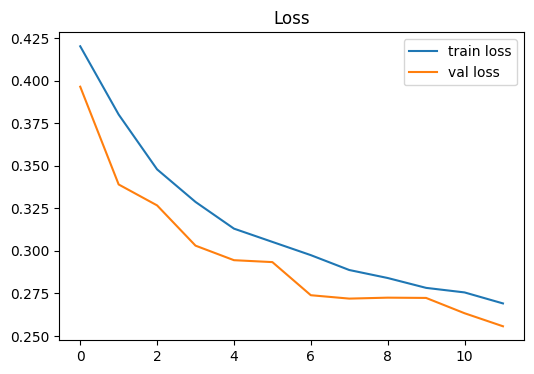


Epoch: 013 train_loss: 0.2654 eval_loss: 0.2592 eval_iou: 0.6802


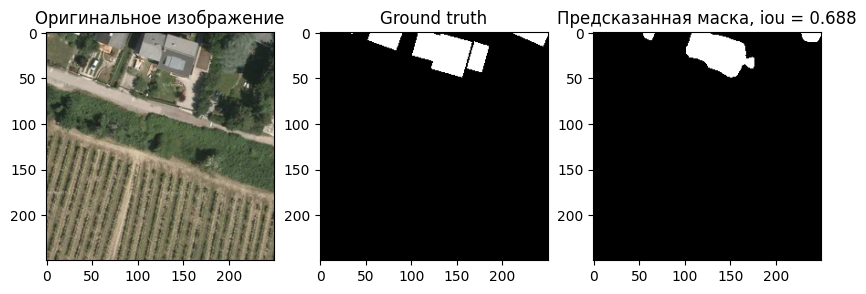


Epoch: 014 train_loss: 0.2617 eval_loss: 0.2564 eval_iou: 0.6877


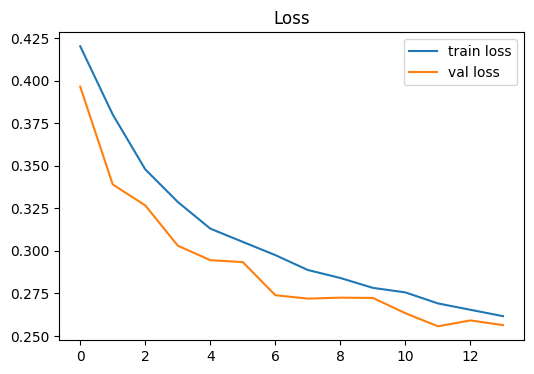


Epoch: 015 train_loss: 0.2584 eval_loss: 0.2554 eval_iou: 0.6871


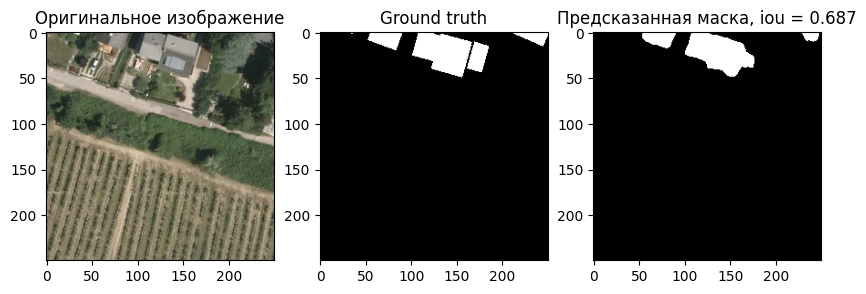


Epoch: 016 train_loss: 0.2577 eval_loss: 0.2592 eval_iou: 0.6865


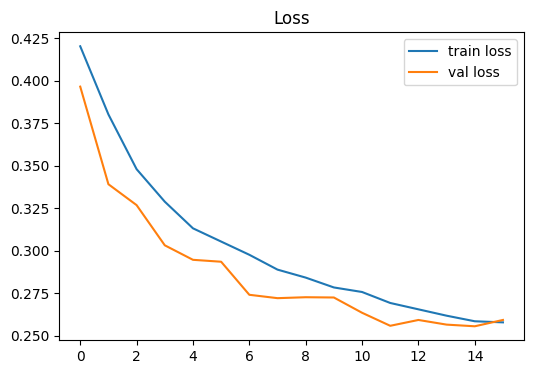

KeyboardInterrupt: 

In [ ]:
unet_model = UNet().to(DEVICE)
optimizer = torch.optim.Adam(unet_model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2)
criterion = unified_focal_loss_4 #delta=0.45
epochs = 16
unet_checkpoints_delta_0_45 = BASE_DIR.joinpath('unet_checkpoints_delta_0_45')
unet_checkpoints_delta_0_45.mkdir(exist_ok=True)
unet_history_train_delta_0_45 = train(unet_model, train_dataloader, valid_dataloader, epochs, criterion, optimizer, ckpt_path=unet_checkpoints_delta_0_45, scheduler=scheduler, plot_loss = True)

## Эксперимент v2

16 эпох. Unified Focal Loss при delta=0.45. Начальный lr=1e-4 и bs=8.

In [ ]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)
batch_size = 8  #попробуем 8
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True, persistent_workers=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)

Found 10199 images for train part
Found 2550 images for val part


epoch:   0%|          | 0/16 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.3802 eval_loss: 0.3333 eval_iou: 0.5794


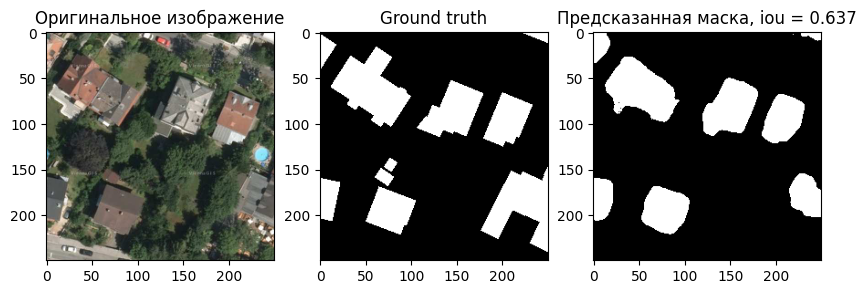


Epoch: 002 train_loss: 0.3285 eval_loss: 0.2975 eval_iou: 0.6371


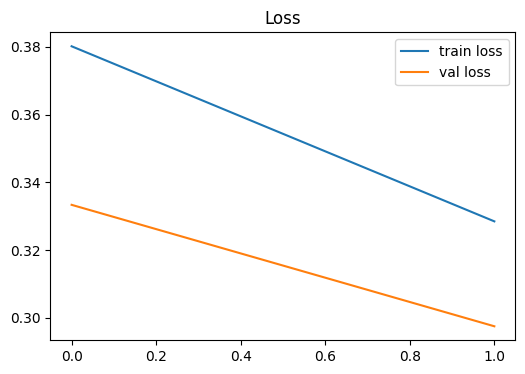


Epoch: 003 train_loss: 0.3067 eval_loss: 0.3242 eval_iou: 0.6023


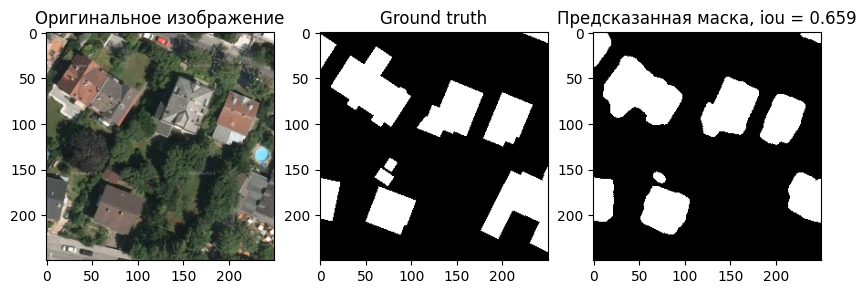


Epoch: 004 train_loss: 0.2922 eval_loss: 0.2811 eval_iou: 0.6585


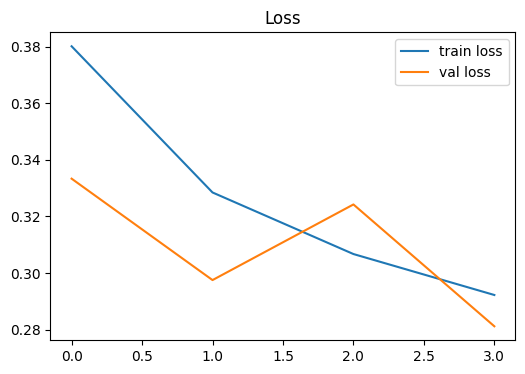


Epoch: 005 train_loss: 0.2805 eval_loss: 0.2646 eval_iou: 0.6729


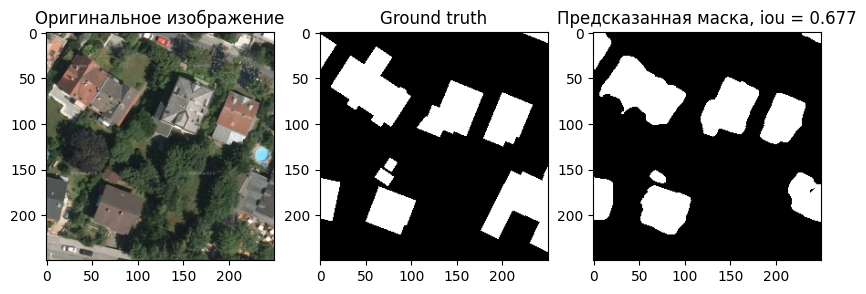


Epoch: 006 train_loss: 0.2737 eval_loss: 0.2654 eval_iou: 0.6766


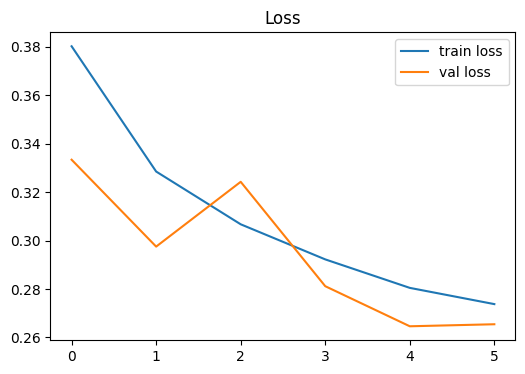


Epoch: 007 train_loss: 0.2661 eval_loss: 0.2483 eval_iou: 0.6987


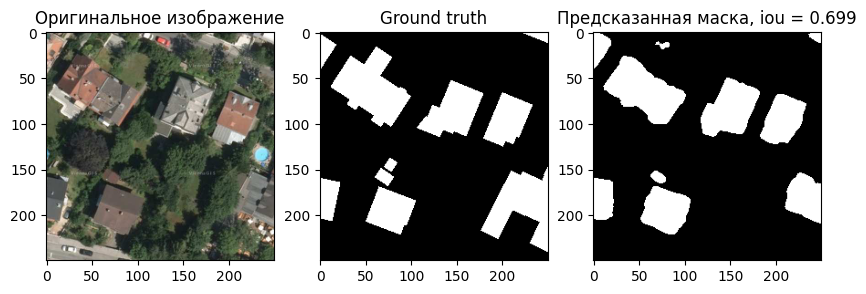


Epoch: 008 train_loss: 0.2607 eval_loss: 0.2499 eval_iou: 0.6989


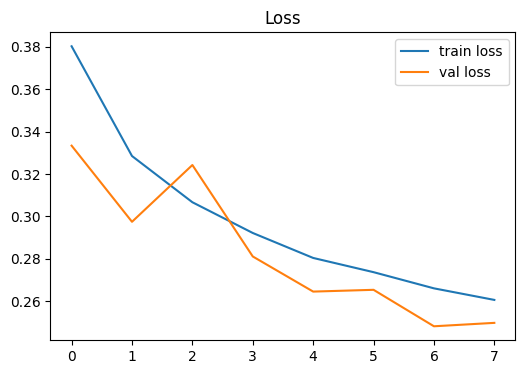


Epoch: 009 train_loss: 0.2566 eval_loss: 0.2433 eval_iou: 0.7045


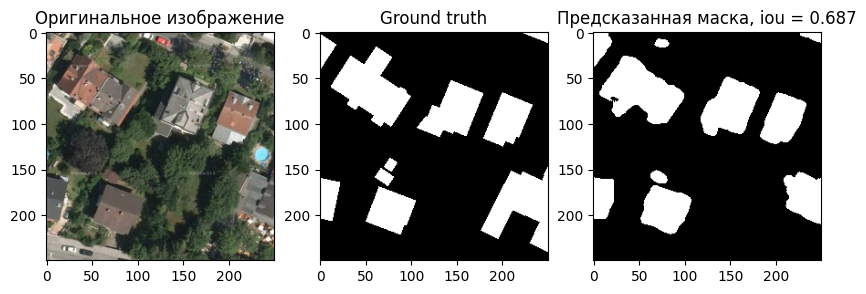


Epoch: 010 train_loss: 0.2527 eval_loss: 0.2542 eval_iou: 0.6867


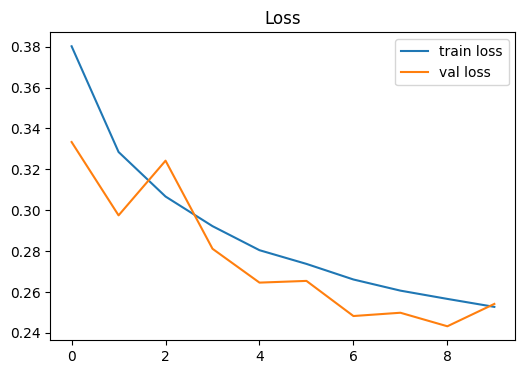


Epoch: 011 train_loss: 0.2497 eval_loss: 0.2434 eval_iou: 0.7037


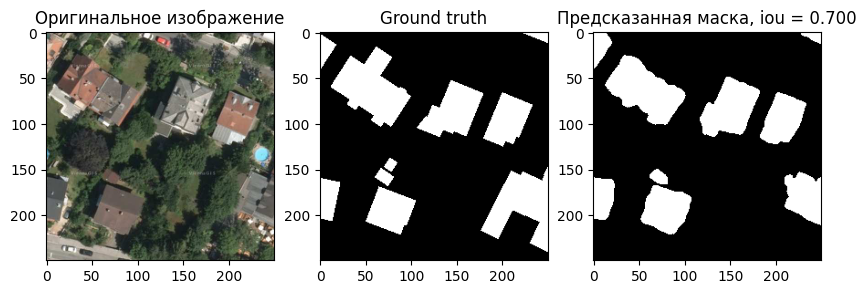


Epoch: 012 train_loss: 0.2472 eval_loss: 0.2463 eval_iou: 0.7001


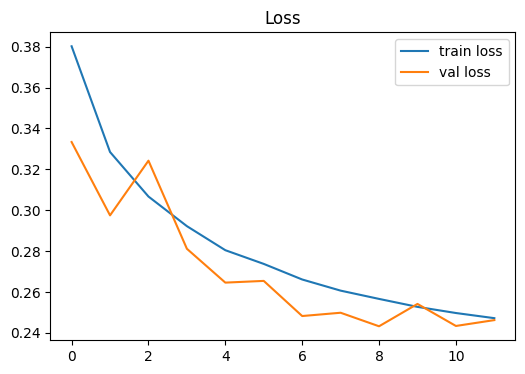


Epoch: 013 train_loss: 0.2293 eval_loss: 0.2219 eval_iou: 0.7338


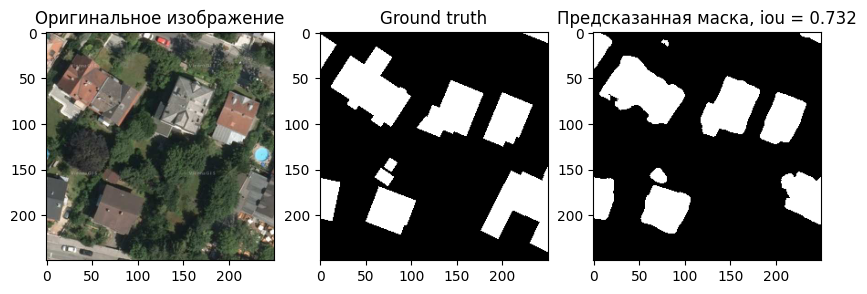


Epoch: 014 train_loss: 0.2256 eval_loss: 0.2227 eval_iou: 0.7316


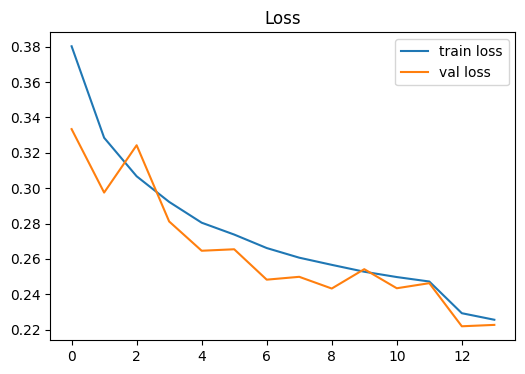


Epoch: 015 train_loss: 0.2226 eval_loss: 0.2200 eval_iou: 0.7360


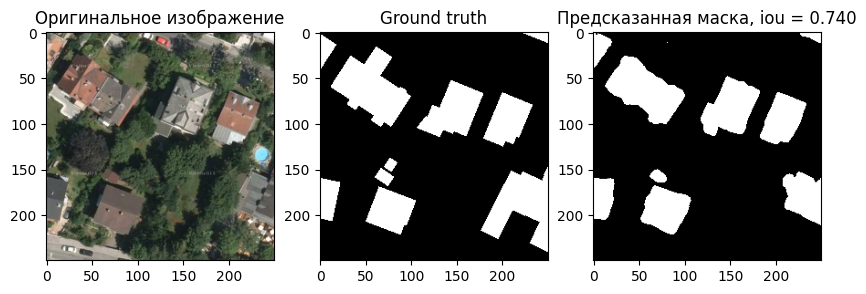


Epoch: 016 train_loss: 0.2219 eval_loss: 0.2188 eval_iou: 0.7396


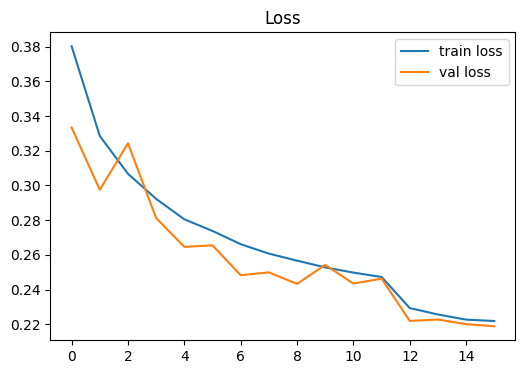

Training complete in 217m 45s


In [ ]:
unet_model = UNet().to(DEVICE)
optimizer = torch.optim.Adam(unet_model.parameters(), lr=1e-4) #изменим lr
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=2)
criterion = unified_focal_loss_4 #delta=0.45
epochs = 16
unet_checkpoints_delta_0_45_1 = BASE_DIR.joinpath('unet_checkpoints_delta_0_45_1')
unet_checkpoints_delta_0_45_1.mkdir(exist_ok=True)
unet_history_train_delta_0_45_1 = train(unet_model, train_dataloader, valid_dataloader, epochs, criterion, optimizer, ckpt_path=unet_checkpoints_delta_0_45_1, scheduler=scheduler, plot_loss = True)

## Сравнение экспериментов v1 и v2.

Загрузка состояния моделей с гугл диска.

In [ ]:
url = 'https://drive.google.com/uc?id=1YB_d1LRupwCHiUebvbImYUbVbd-WOaoy' #загрузим модель (lr=1e-3, bs=4) best_iou_v1
output = 'best_iou_v1.pt'
gdown.download(url, output)

url = 'https://drive.google.com/uc?id=1BH5wjJFK6xJEnf13FY7PR8i5O4xSU7na' #загрузим модель (lr=1e-4, bs=8) best_iou_v2
output = 'best_iou_v2.pt'
gdown.download(url, output)

Downloading...
From (original): https://drive.google.com/uc?id=1YB_d1LRupwCHiUebvbImYUbVbd-WOaoy
From (redirected): https://drive.google.com/uc?id=1YB_d1LRupwCHiUebvbImYUbVbd-WOaoy&confirm=t&uuid=682854ff-373c-4a49-9bf1-73d4cc0c0c2c
To: /kaggle/working/best_iou_v1.pt
100%|██████████| 373M/373M [00:05<00:00, 73.2MB/s] 
Downloading...
From (original): https://drive.google.com/uc?id=1BH5wjJFK6xJEnf13FY7PR8i5O4xSU7na
From (redirected): https://drive.google.com/uc?id=1BH5wjJFK6xJEnf13FY7PR8i5O4xSU7na&confirm=t&uuid=0bee966e-53d4-49dc-be7c-2ee1e9b54a6a
To: /kaggle/working/best_iou_v2.pt
100%|██████████| 373M/373M [00:03<00:00, 108MB/s]  


'best_iou_v2.pt'

In [ ]:
url = 'https://drive.google.com/uc?id=1u5hq4hO8B3kW6UkbMlaLYJf3F3GbuCdm' #загрузим историю обучения модели (lr=1e-3, bs=4) history_train_v1
output = 'history_train_v1.csv'
gdown.download(url, output)

url = 'https://drive.google.com/uc?id=10Zv4iVOv86f591iZuwqJnhENj4oUxT5W' #загрузим историю обучения модели (lr=1e-4, bs=8) history_train_v2
output = 'history_train_v2.csv'
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=1u5hq4hO8B3kW6UkbMlaLYJf3F3GbuCdm
To: /kaggle/working/history_train_v1.csv
100%|██████████| 549/549 [00:00<00:00, 1.99MB/s]
Downloading...
From: https://drive.google.com/uc?id=10Zv4iVOv86f591iZuwqJnhENj4oUxT5W
To: /kaggle/working/history_train_v2.csv
100%|██████████| 948/948 [00:00<00:00, 3.50MB/s]


'history_train_v2.csv'

### История обучения

In [ ]:
df1 = pd.read_csv(BASE_DIR.joinpath('history_train_v1.csv'))
df2 = pd.read_csv(BASE_DIR.joinpath('history_train_v2.csv'))

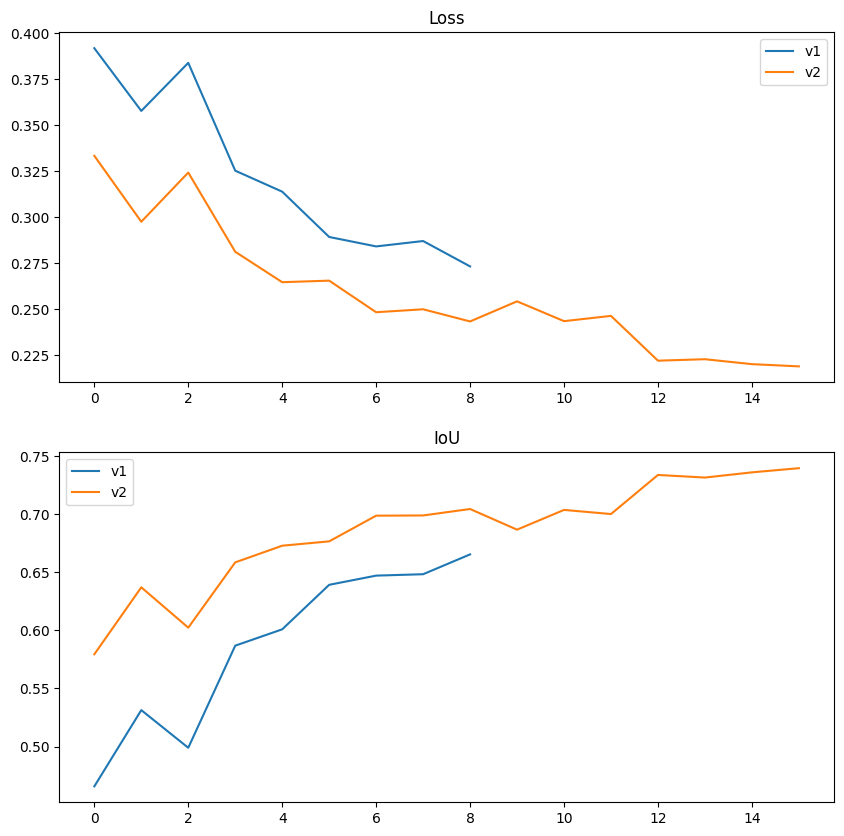

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

ax1.plot(df1['val_loss'], label = 'v1')
ax1.plot(df2['val_loss'], label = 'v2')
ax2.plot(df1['val_iou'], label='v1')
ax2.plot(df2['val_iou'], label='v2')
ax1.set_title("Loss")
ax2.set_title("IoU")
ax1.legend()
ax2.legend()
plt.show()

При первом запуске модели v1 была ошибка в условии преждевременной остановки обучения и модель обучалась 9 эпох. При последующем запуске обучение прервалось из-за достижения лимита после 16 эпохи. Т.к. состояние модели сохраняется после каждой эпохи, а история обучения только в конце обучения, то после 2 запуска история не сохранилась. В любом случае видно, что у v2 уже на первых 9 эпохах качество лучше. При новом запуске график будет полноценным

### Проверка на тестовых данных

In [ ]:
unet_model_v1 = UNet().to(DEVICE)
checkpoints_v1 = torch.load(BASE_DIR.joinpath('best_iou_v1.pt'), map_location=DEVICE)
unet_model_v1.load_state_dict(checkpoints_v1['model_state_dict'])
best_epoch_v1 = checkpoints_v1['epoch']

unet_model_v2 = UNet().to(DEVICE)
checkpoints_v2 = torch.load(BASE_DIR.joinpath('best_iou_v2.pt'), map_location=DEVICE)
unet_model_v2.load_state_dict(checkpoints_v2['model_state_dict'])
best_epoch_v2 = checkpoints_v2['epoch']

Загрузка тестовых данных.

In [ ]:
TEST_GT_DIR = TEST_DIR.joinpath("gt/")
test_subimg_files = sorted(list(TEST_IMG_DIR.rglob('*.png')))
test_subimg_labels = [path.name for path in test_subimg_files]

In [ ]:
#тестовый датасет загрузим в режими 'val', т.к. нужны маски для проверки качества моделей
test_dataset = GeodataDataset(test_subimg_labels, img_path=TEST_IMG_DIR, mode='val', transforms=test_transform, gt_path=TEST_GT_DIR)
batch_size = 1
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2,  pin_memory=True)

Found 58 images for val part


In [ ]:
data = {
  "IoU": [0, 0],
  "Dice": [0, 0],
  "Precision": [0, 0],
  "Recall": [0, 0]
}
data["IoU"][0], data["Dice"][0], data["Precision"][0], data["Recall"][0] = test(unet_model_v1, test_dataloader)
data["IoU"][1], data["Dice"][1], data["Precision"][1], data["Recall"][1] = test(unet_model_v2, test_dataloader)

In [ ]:
df_metrics = pd.DataFrame(data, index=['v1','v2'])
df_metrics

,IoU,Dice,Precision,Recall
v1,0.658749,0.780015,0.730377,0.895810
v2,0.712176,0.816056,0.783660,0.901844


По всем метрикам модель v2 лучше.

In [ ]:
print(f"Эпоха с лучшим IoU для первой версии: {best_epoch_v1}")
print(f"Эпоха с лучшим IoU для второй версии: {best_epoch_v2}")

Эпоха с лучшим IoU для первой версии: 14
Эпоха с лучшим IoU для второй версии: 16


Дла модели v2 лучшая эпоха 16 - это последняя. Значит качество может улучшиться еще.

Посмотрим на предсказанную маску одного изображения

In [ ]:
img, gt = next(iter(test_dataset))
mask1 = predict_one(unet_model_v1, img.unsqueeze(0))
mask2 = predict_one(unet_model_v2, img.unsqueeze(0))

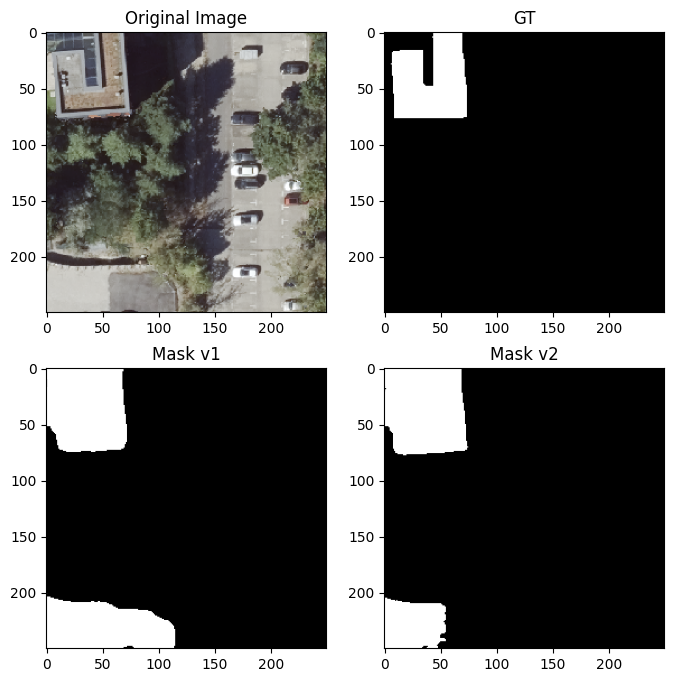

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(8, 8))

orig_img = CenterCrop(size=[250, 250])(img)
orig_img = orig_img.cpu().detach().numpy().transpose((1, 2, 0))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
orig_img = std * orig_img + mean
orig_img = np.clip(orig_img, 0, 1)
mask_gt = gt.cpu().detach().numpy().squeeze()
mask_gt = mask_gt > 0.5

axes[0,0].imshow(orig_img);
axes[0,0].set_title("Original Image")

axes[0,1].imshow(mask_gt, cmap='gray')
axes[0,1].set_title("GT")

axes[1,0].imshow(mask1, cmap='gray')
axes[1,0].set_title("Mask v1")

axes[1,1].imshow(mask2, cmap='gray')
axes[1,1].set_title("Mask v2")

plt.show()

Видно, что обе модели еще плохо справляются, но результат v2 лучше. Будем дальше дообучать v2.

## Эксперимент v2_1

In [ ]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)
batch_size = 8
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True, persistent_workers=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)

Found 10199 images for train part
Found 2550 images for val part


epoch:   0%|          | 0/16 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.2209 eval_loss: 0.2111 eval_iou: 0.7477


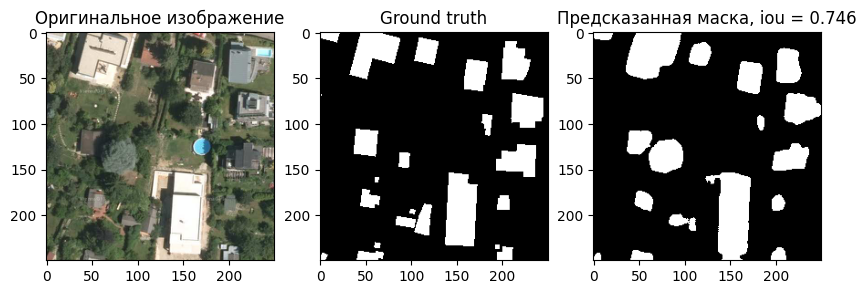


Epoch: 002 train_loss: 0.2200 eval_loss: 0.2124 eval_iou: 0.7457


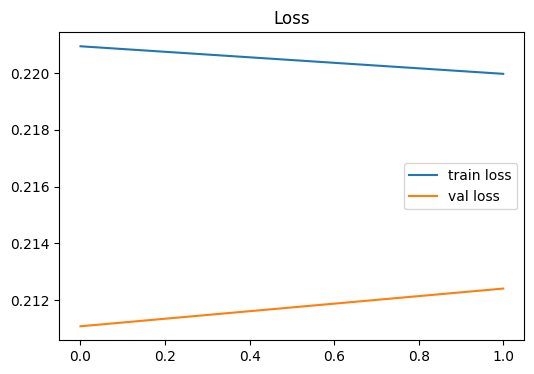


Epoch: 003 train_loss: 0.2181 eval_loss: 0.2113 eval_iou: 0.7488


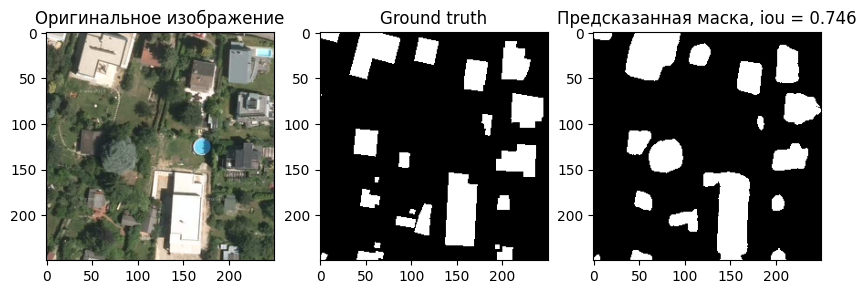


Epoch: 004 train_loss: 0.2172 eval_loss: 0.2122 eval_iou: 0.7458


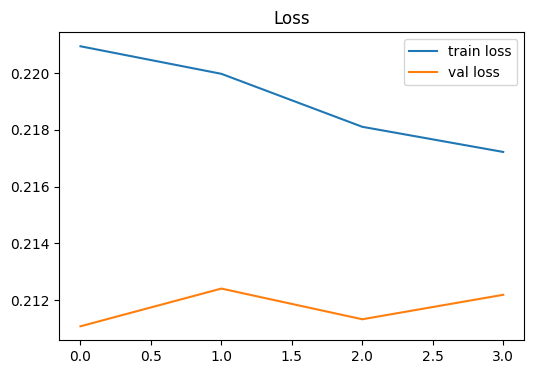


Epoch: 005 train_loss: 0.2150 eval_loss: 0.2088 eval_iou: 0.7510


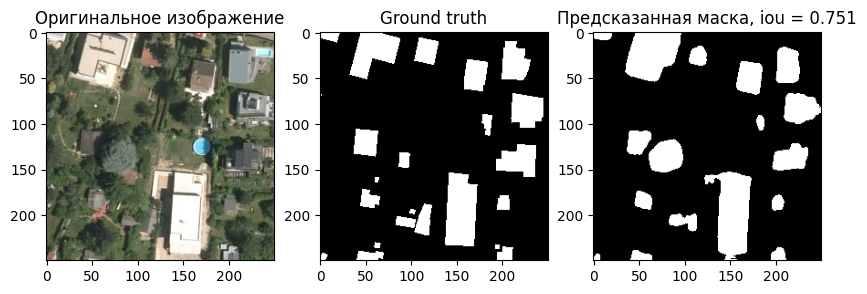


Epoch: 006 train_loss: 0.2134 eval_loss: 0.2094 eval_iou: 0.7507


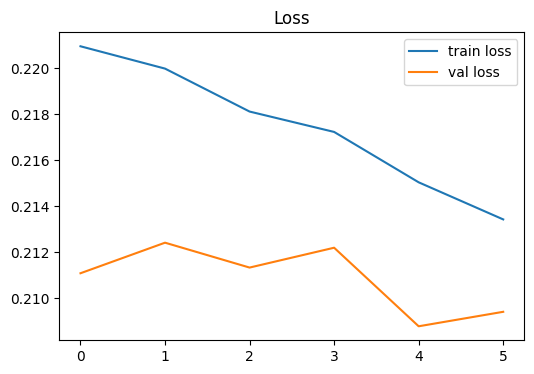


Epoch: 007 train_loss: 0.2127 eval_loss: 0.2077 eval_iou: 0.7536


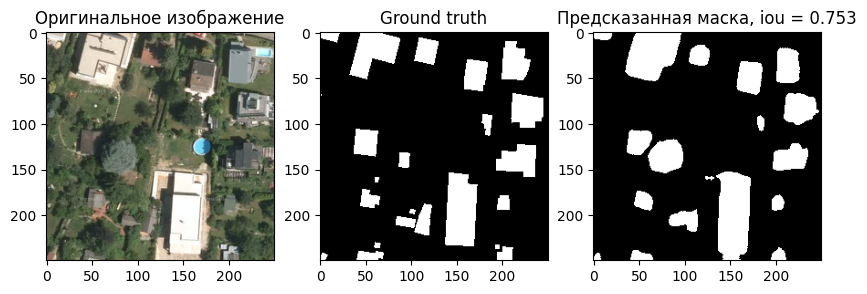


Epoch: 008 train_loss: 0.2117 eval_loss: 0.2076 eval_iou: 0.7530


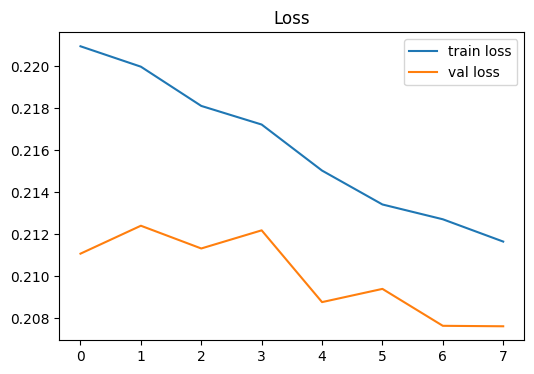


Epoch: 009 train_loss: 0.2114 eval_loss: 0.2116 eval_iou: 0.7476


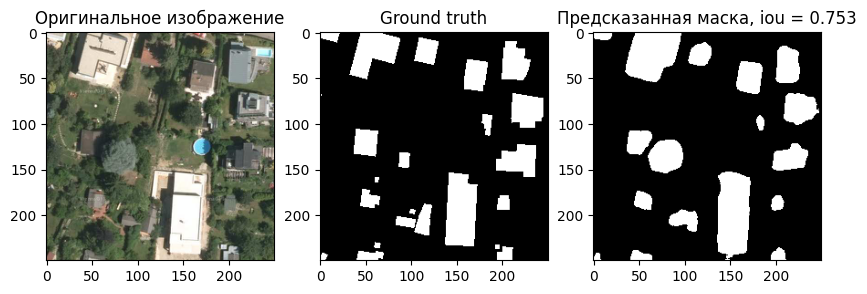


Epoch: 010 train_loss: 0.2112 eval_loss: 0.2074 eval_iou: 0.7533


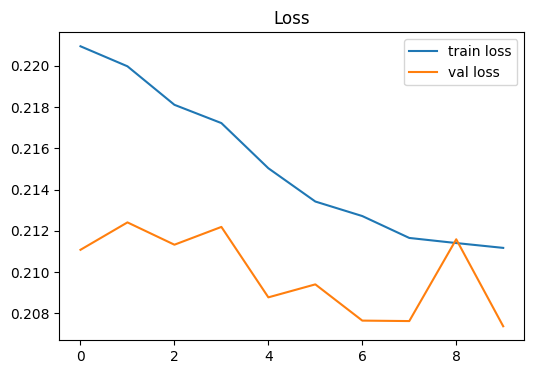


Epoch: 011 train_loss: 0.2106 eval_loss: 0.2077 eval_iou: 0.7530


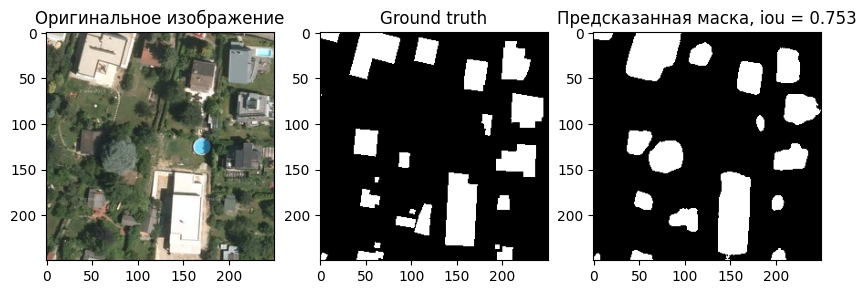


Epoch: 012 train_loss: 0.2095 eval_loss: 0.2083 eval_iou: 0.7532


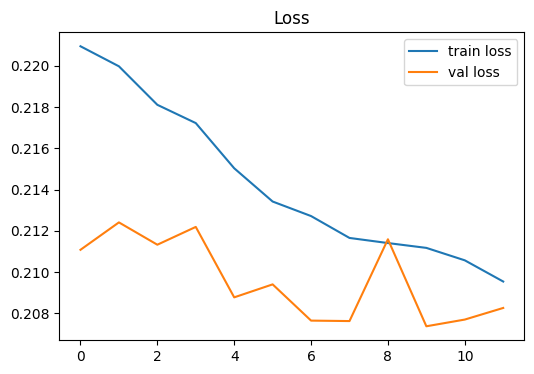


Epoch: 013 train_loss: 0.2095 eval_loss: 0.2098 eval_iou: 0.7499
Преждевременная остановка обучения на 13 эпохе, т.к. качество модели не увеличивается
Training complete in 216m 47s


In [ ]:
optimizer_v2 = torch.optim.Adam(unet_model_v2.parameters(), lr=1e-4)
optimizer_v2.load_state_dict(checkpoints_v2['optimizer_state_dict'])
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_v2, mode='min', factor=0.5, patience=2)
criterion = unified_focal_loss_4
epochs = 16
unet_checkpoints_delta_0_45_1_1 = BASE_DIR.joinpath('unet_checkpoints_delta_0_45_1_1')
unet_checkpoints_delta_0_45_1_1.mkdir(exist_ok=True)
unet_history_train_delta_0_45_1_1 = train(unet_model_v2, train_dataloader, valid_dataloader, epochs, criterion, optimizer_v2, ckpt_path=unet_checkpoints_delta_0_45_1_1, scheduler=scheduler, plot_loss = True)

## Сравнение экспериментов v2 и v2_1

In [ ]:
url = 'https://drive.google.com/uc?id=1PoifMTerY-rfnOlTVrWi_3MaAQ20oVbP'
output = 'best_iou_v2_1.pt'
gdown.download(url, output)

url = 'https://drive.google.com/uc?id=1TzVhRHzAU3J0U_LiuSxe3znAkEt9GImw'
output = 'history_train_v2_1.csv'
gdown.download(url, output)

Downloading...
From (original): https://drive.google.com/uc?id=1PoifMTerY-rfnOlTVrWi_3MaAQ20oVbP
From (redirected): https://drive.google.com/uc?id=1PoifMTerY-rfnOlTVrWi_3MaAQ20oVbP&confirm=t&uuid=3d3979f2-fbfc-4f12-9cc8-098618b8c923
To: /kaggle/working/best_iou_v2_1.pt
100%|██████████| 373M/373M [00:03<00:00, 110MB/s]  
Downloading...
From: https://drive.google.com/uc?id=1TzVhRHzAU3J0U_LiuSxe3znAkEt9GImw
To: /kaggle/working/history_train_v2_1.csv
100%|██████████| 783/783 [00:00<00:00, 2.73MB/s]


'history_train_v2_1.csv'

### История обучения

In [ ]:
df2_1 = pd.read_csv(BASE_DIR.joinpath('history_train_v2_1.csv'))
# т.к. v2_1 это дообученная v2, объеденим истории обучения в одну
df2_all = pd.concat([df2, df2_1], axis=0).reset_index(drop=True)

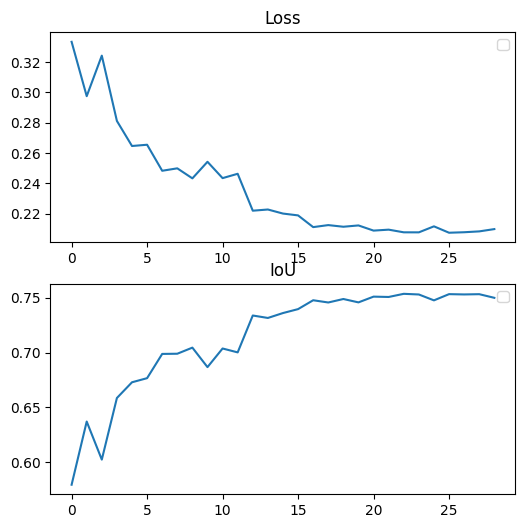

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 6))

ax1.plot(df2_all['val_loss'])
ax2.plot(df2_all['val_iou'])
ax1.set_title("Loss")
ax2.set_title("IoU")
ax1.legend()
ax2.legend()
plt.show()

Была преждевременная остановка обучения на 13 эпохе (в рамках текущего обучения), т.к. качество модели не увеличивалось. Это можно увидеть на графике - IoU перестает увеличиваться.

### Проверка на тестовых данных

Подгрузим модели.

In [ ]:
unet_model_v2 = UNet().to(DEVICE)
checkpoints_v2 = torch.load(BASE_DIR.joinpath('best_iou_v2.pt'), map_location=DEVICE)
unet_model_v2.load_state_dict(checkpoints_v2['model_state_dict'])
best_epoch_v2 = checkpoints_v2['epoch']

unet_model_v2_1 = UNet().to(DEVICE)
checkpoints_v2_1 = torch.load(BASE_DIR.joinpath('best_iou_v2_1.pt'), map_location=DEVICE)
unet_model_v2_1.load_state_dict(checkpoints_v2_1['model_state_dict'])
best_epoch_v2_1 = checkpoints_v2_1['epoch']

Получим общее число эпох обучения модели:

In [ ]:
print(f"Эпоха с лучшим IoU: {best_epoch_v2 + best_epoch_v2_1}")

Эпоха с лучшим IoU: 23


In [ ]:
data_1 = {
  "IoU": [0, 0],
  "Dice": [0, 0],
  "Precision": [0, 0],
  "Recall": [0, 0]
}
data_1["IoU"][0], data_1["Dice"][0], data_1["Precision"][0], data_1["Recall"][0] = test(unet_model_v2, test_dataloader)
data_1["IoU"][1], data_1["Dice"][1], data_1["Precision"][1], data_1["Recall"][1] = test(unet_model_v2_1, test_dataloader)
df_metrics = pd.DataFrame(data_1, index=['16 epoch','23 epoch'])
df_metrics

,IoU,Dice,Precision,Recall
16 epoch,0.721501,0.825300,0.766587,0.935042
23 epoch,0.717972,0.821229,0.794343,0.897969


Все метрики на тестовой выборке кроме Presicion ухудшились.

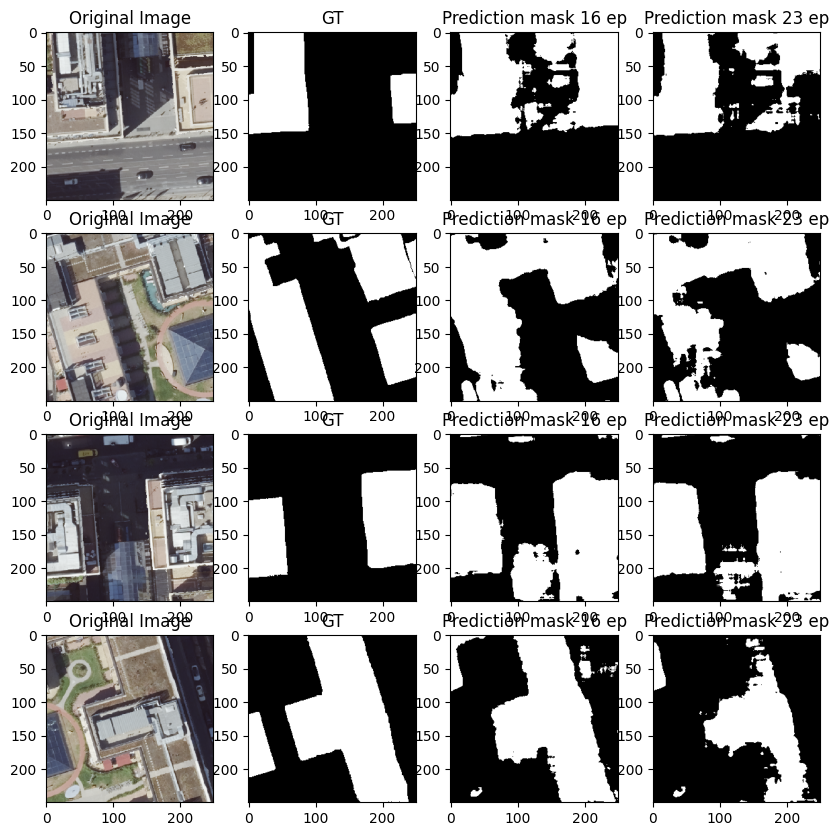

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(10, 10))

mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

for i in range(4):
    random_img = int(np.random.uniform(0,57))
    img, gt = test_dataset[random_img]
    mask1 = predict_one(unet_model_v2, img.unsqueeze(0))
    mask2 = predict_one(unet_model_v2_1, img.unsqueeze(0))
    orig_img = CenterCrop(size=[250, 250])(img)
    orig_img = orig_img.cpu().detach().numpy().transpose((1, 2, 0))
    orig_img = std * orig_img + mean
    orig_img = np.clip(orig_img, 0, 1)
    mask_gt = gt.cpu().detach().numpy().squeeze()
    mask_gt = mask_gt > 0.5
    axes[i,0].imshow(orig_img);
    axes[i,0].set_title("Original Image")

    axes[i,1].imshow(mask_gt, cmap='gray')
    axes[i,1].set_title("GT")

    axes[i,2].imshow(mask1, cmap='gray')
    axes[i,2].set_title("Prediction mask 16 ep")

    axes[i,3].imshow(mask2, cmap='gray')
    axes[i,3].set_title("Prediction mask 23 ep")

plt.show()



Визуально сложно сравнить результаты модели на 16 и на 23 эпохах. Однако по метрикам видно, что качество не растет.

## Эксперимент v2_focal

У Focal-Tversky loss есть проблема в сходимости модели под конец обучения. Можно попробовать дообучать на более простом лоссе. Например, просто Focal Loss. Для этого просто установим параметр lamda=1.

In [ ]:
focal_loss = UnifiedFocalLoss(lamda=1)

In [ ]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)
batch_size = 8
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True, persistent_workers=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)

Found 10199 images for train part
Found 2550 images for val part


Подгрузим еще раз модель v2, которую будем дообучать.

In [ ]:
unet_model_v2 = UNet().to(DEVICE)
checkpoints_v2 = torch.load(BASE_DIR.joinpath('best_iou_v2.pt'), map_location=DEVICE)
unet_model_v2.load_state_dict(checkpoints_v2['model_state_dict'])
unet_model_v2

UNet(
  (encoder1): EncoderBlockUnet(
    (layers): ModuleList(
      (0): ConvReLU(
        (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1))
        (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
      )
      (1): ConvReLU(
        (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
      )
    )
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (encoder2): EncoderBlockUnet(
    (layers): ModuleList(
      (0): ConvReLU(
        (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
        (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
      )
      (1): ConvReLU(
        (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), pad

Заморозим энкодер и bottleneck. Будем дообучать только декодер.

In [ ]:
for param in unet_model_v2.encoder1.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder2.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder3.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder4.parameters():
    param.requires_grad = False
for param in unet_model_v2.bottleneck.parameters():
    param.requires_grad = False

In [ ]:
optimizer_v2 = torch.optim.Adam(unet_model_v2.parameters(), lr=1e-4)
optimizer_v2.load_state_dict(checkpoints_v2['optimizer_state_dict'])
optimizer_v2

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 2e-05
    maximize: False
    weight_decay: 0
)

epoch:   0%|          | 0/6 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.0710 eval_loss: 0.0721 eval_iou: 0.7418


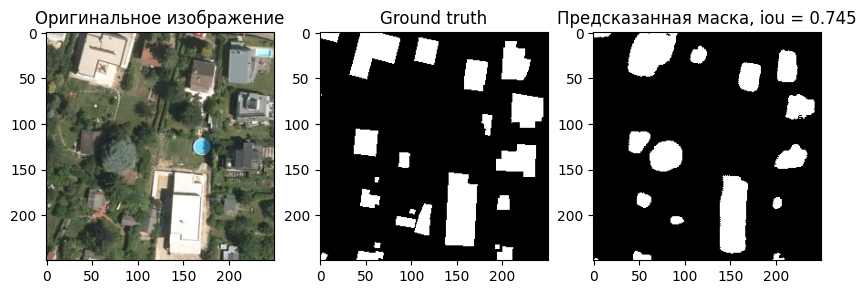


Epoch: 002 train_loss: 0.0695 eval_loss: 0.0718 eval_iou: 0.7452


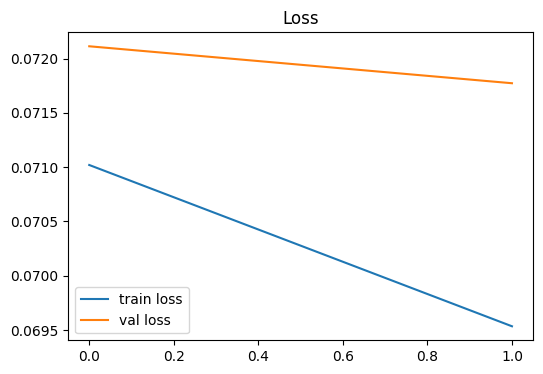


Epoch: 003 train_loss: 0.0685 eval_loss: 0.0727 eval_iou: 0.7443


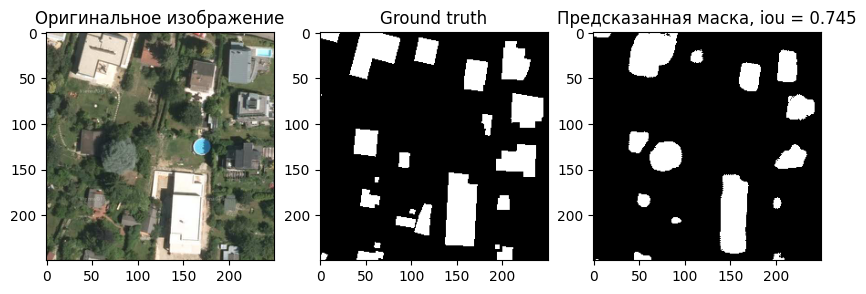


Epoch: 004 train_loss: 0.0678 eval_loss: 0.0715 eval_iou: 0.7453


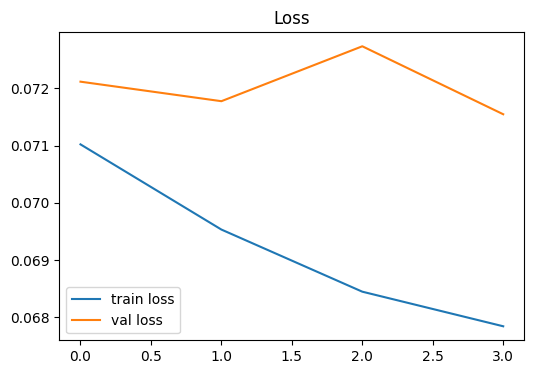


Epoch: 005 train_loss: 0.0685 eval_loss: 0.0718 eval_iou: 0.7461


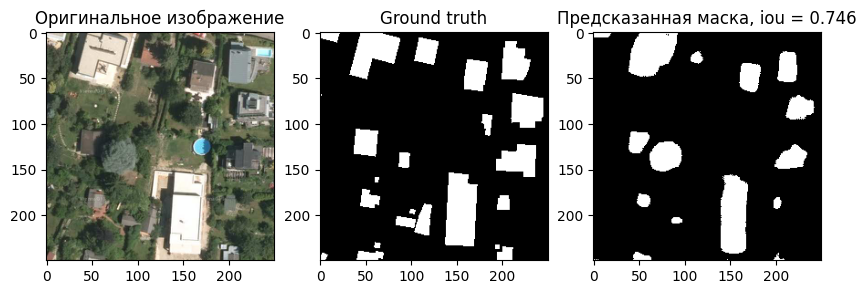


Epoch: 006 train_loss: 0.0680 eval_loss: 0.0713 eval_iou: 0.7464


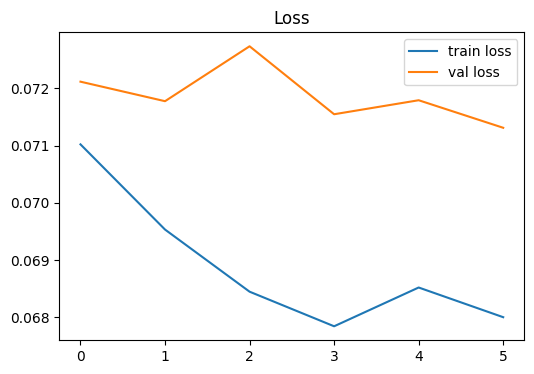

Преждевременная остановка обучения на 6 эпохе из-за переобучения
Training complete in 71m 1s


In [ ]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_v2, mode='min', factor=0.5, patience=2)
criterion = focal_loss
epochs = 6
unet_checkpoints_delta_0_45_1_focal = BASE_DIR.joinpath('unet_checkpoints_delta_0_45_1_focal')
unet_checkpoints_delta_0_45_1_focal.mkdir(exist_ok=True)
unet_history_train_delta_0_45_1_focal = train(unet_model_v2, train_dataloader, valid_dataloader, epochs, criterion, optimizer_v2, ckpt_path=unet_checkpoints_delta_0_45_1_focal, scheduler=scheduler, plot_loss = True)

## Эксперимент v2_focal_0_85

Еще один эксперимент - дообучим v2 с lamda=0.85 в Unified Focal Loss. Т.е. по сравнению с предыдущим экспериментом оставим немного влияния Focal Tversky Loss.

In [ ]:
focal_loss_0_85 = UnifiedFocalLoss(lamda=0.85)

In [ ]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)
batch_size = 8
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True, persistent_workers=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)

Found 10199 images for train part
Found 2550 images for val part


In [ ]:
unet_model_v2 = UNet().to(DEVICE)
checkpoints_v2 = torch.load(BASE_DIR.joinpath('best_iou_v2.pt'), map_location=DEVICE)
unet_model_v2.load_state_dict(checkpoints_v2['model_state_dict'])

for param in unet_model_v2.encoder1.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder2.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder3.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder4.parameters():
    param.requires_grad = False
for param in unet_model_v2.bottleneck.parameters():
    param.requires_grad = False

optimizer_v2 = torch.optim.Adam(unet_model_v2.parameters(), lr=1e-4)
optimizer_v2.load_state_dict(checkpoints_v2['optimizer_state_dict'])

epoch:   0%|          | 0/6 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.1281 eval_loss: 0.1263 eval_iou: 0.7436


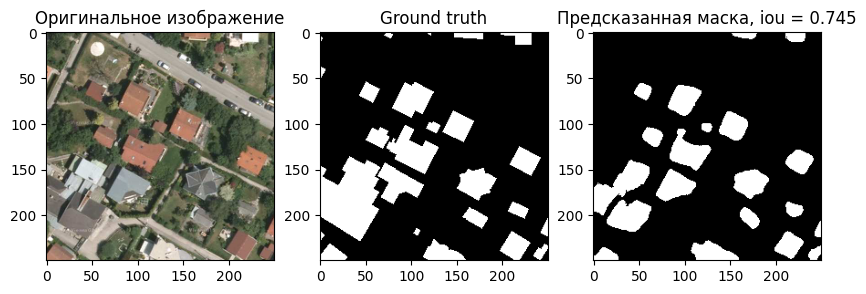


Epoch: 002 train_loss: 0.1265 eval_loss: 0.1265 eval_iou: 0.7446


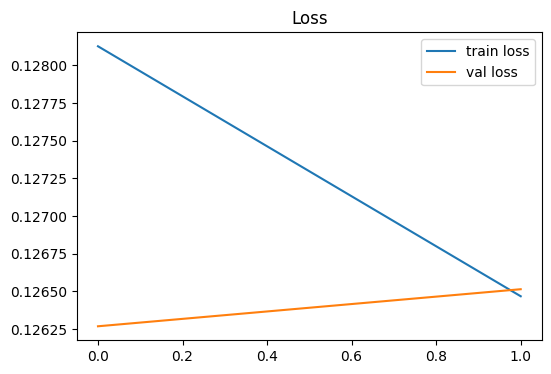


Epoch: 003 train_loss: 0.1264 eval_loss: 0.1258 eval_iou: 0.7454


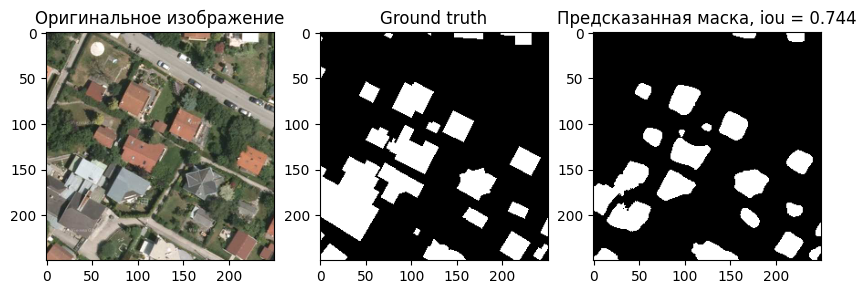


Epoch: 004 train_loss: 0.1263 eval_loss: 0.1259 eval_iou: 0.7445


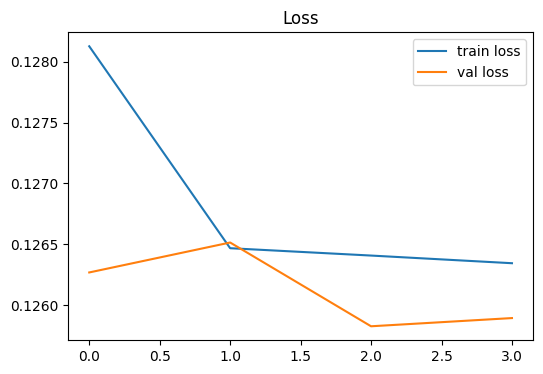


Epoch: 005 train_loss: 0.1257 eval_loss: 0.1254 eval_iou: 0.7465


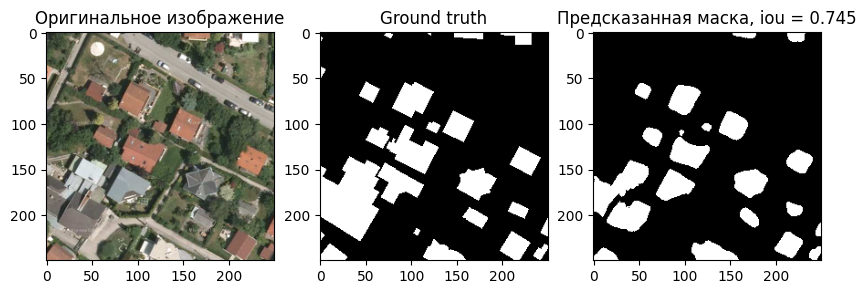


Epoch: 006 train_loss: 0.1249 eval_loss: 0.1255 eval_iou: 0.7451


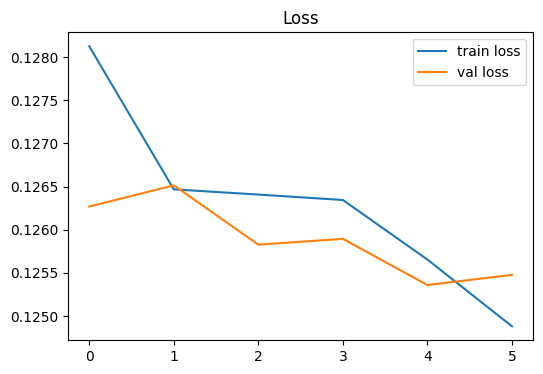

Training complete in 67m 39s


In [ ]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_v2, mode='min', factor=0.5, patience=2)
criterion = focal_loss_0_85
epochs = 6
unet_checkpoints_delta_0_45_1_focal_0_85 = BASE_DIR.joinpath('unet_checkpoints_delta_0_45_1_focal_0_85')
unet_checkpoints_delta_0_45_1_focal_0_85.mkdir(exist_ok=True)
unet_history_train_delta_0_45_1_focal_0_85 = train(unet_model_v2, train_dataloader, valid_dataloader, epochs, criterion, optimizer_v2, ckpt_path=unet_checkpoints_delta_0_45_1_focal_0_85, scheduler=scheduler, plot_loss = True)

## Сравнение экспериментов v2_focal и v2_focal_0_85

In [ ]:
url = 'https://drive.google.com/uc?id=1TVdkYcirDravxpGtahOzTqMKwJFKy0uV'
output = 'best_iou_v2_focal.pt'
gdown.download(url, output)

url = 'https://drive.google.com/uc?id=1OcWxUhAvHGq2ySe3CrwjxfoWuAw-pBEo'
output = 'best_iou_v2_focal_0_85.pt'
gdown.download(url, output)

url = 'https://drive.google.com/uc?id=18riJV9-EdSaDGBJpc-gT6GuM1AkDI93t'
output = 'history_train_v2_focal.csv'
gdown.download(url, output)

url = 'https://drive.google.com/uc?id=1CwDfsw4Qn3FO1WrPwrWpoGPgQ02yEdrl'
output = 'history_train_v2_focal_0_85.csv'
gdown.download(url, output)

Downloading...
From (original): https://drive.google.com/uc?id=1TVdkYcirDravxpGtahOzTqMKwJFKy0uV
From (redirected): https://drive.google.com/uc?id=1TVdkYcirDravxpGtahOzTqMKwJFKy0uV&confirm=t&uuid=5ec5eedc-7b9d-433f-b182-5c7890a7e1ea
To: /kaggle/working/best_iou_v2_focal.pt
100%|██████████| 373M/373M [00:02<00:00, 132MB/s]  
Downloading...
From (original): https://drive.google.com/uc?id=1OcWxUhAvHGq2ySe3CrwjxfoWuAw-pBEo
From (redirected): https://drive.google.com/uc?id=1OcWxUhAvHGq2ySe3CrwjxfoWuAw-pBEo&confirm=t&uuid=9b0034a2-ea95-4996-a7a6-583d3d965e2b
To: /kaggle/working/best_iou_v2_focal_0_85.pt
100%|██████████| 373M/373M [00:02<00:00, 127MB/s]  
Downloading...
From: https://drive.google.com/uc?id=18riJV9-EdSaDGBJpc-gT6GuM1AkDI93t
To: /kaggle/working/history_train_v2_focal.csv
100%|██████████| 378/378 [00:00<00:00, 1.35MB/s]
Downloading...
From: https://drive.google.com/uc?id=1CwDfsw4Qn3FO1WrPwrWpoGPgQ02yEdrl
To: /kaggle/working/history_train_v2_focal_0_85.csv
100%|██████████| 377/37

'history_train_v2_focal_0_85.csv'

### История обучения

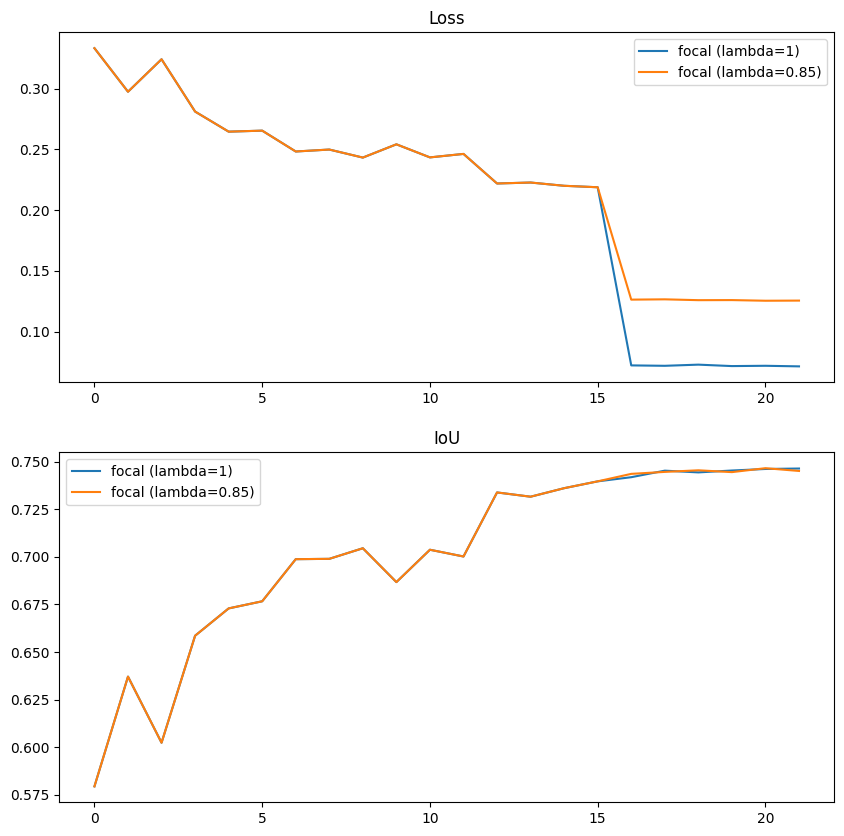

In [ ]:
df0 = pd.read_csv(BASE_DIR.joinpath('history_train_v2.csv'))
df1 = pd.read_csv(BASE_DIR.joinpath('history_train_v2_focal.csv'))
df2 = pd.read_csv(BASE_DIR.joinpath('history_train_v2_focal_0_85.csv'))
df_focal = pd.concat([df0, df1], axis=0).reset_index(drop=True)
df_focal_0_85 = pd.concat([df0, df2], axis=0).reset_index(drop=True)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

ax1.plot(df_focal['val_loss'], label = 'focal (lambda=1)')
ax1.plot(df_focal_0_85['val_loss'], label = 'focal (lambda=0.85)')
ax2.plot(df_focal['val_iou'], label='focal (lambda=1)')
ax2.plot(df_focal_0_85['val_iou'], label='focal (lambda=0.85)')
ax1.set_title("Loss")
ax2.set_title("IoU")
ax1.legend()
ax2.legend()
plt.show()

Здесь можно только увидеть, что focal loss меньше focal tversky loss.

### Проверка на тестовых данных.

In [ ]:
unet_model_v2_focal = UNet().to(DEVICE)
checkpoints_v2_focal = torch.load(BASE_DIR.joinpath('best_iou_v2_focal.pt'), map_location=DEVICE)
unet_model_v2_focal.load_state_dict(checkpoints_v2_focal['model_state_dict'])
best_epoch_v2_focal = checkpoints_v2_focal['epoch']

unet_model_v2_focal_0_85 = UNet().to(DEVICE)
checkpoints_v2_focal_0_85 = torch.load(BASE_DIR.joinpath('best_iou_v2_focal_0_85.pt'), map_location=DEVICE)
unet_model_v2_focal_0_85.load_state_dict(checkpoints_v2_focal_0_85['model_state_dict'])
best_epoch_v2_focal_0_85 = checkpoints_v2_focal_0_85['epoch']

unet_model_v2 = UNet().to(DEVICE)
checkpoints_v2 = torch.load(BASE_DIR.joinpath('best_iou_v2.pt'), map_location=DEVICE)
unet_model_v2.load_state_dict(checkpoints_v2['model_state_dict'])

print(f"Эпоха с лучшим IoU для первой версии: {best_epoch_v2+best_epoch_v2_focal}")
print(f"Эпоха с лучшим IoU для второй версии: {best_epoch_v2+best_epoch_v2_focal_0_85}")

Эпоха с лучшим IoU для первой версии: 22
Эпоха с лучшим IoU для второй версии: 21


In [ ]:
data = {
  "IoU": [0, 0, 0],
  "Dice": [0, 0, 0],
  "Precision": [0, 0, 0],
  "Recall": [0, 0, 0]
}
data["IoU"][0], data["Dice"][0], data["Precision"][0], data["Recall"][0] = test(unet_model_v2_focal, test_dataloader)
data["IoU"][1], data["Dice"][1], data["Precision"][1], data["Recall"][1] = test(unet_model_v2_focal_0_85, test_dataloader)
data["IoU"][2], data["Dice"][2], data["Precision"][2], data["Recall"][2] = test(unet_model_v2, test_dataloader)


df_metrics = pd.DataFrame(data, index=['focal (lamda=1)','focal (lamda=0.85)', 'v2'])
df_metrics

,IoU,Dice,Precision,Recall
focal (lamda=1),0.712521,0.816807,0.793207,0.890247
focal (lamda=0.85),0.711309,0.816552,0.772433,0.915074
v2,0.712176,0.816056,0.783660,0.901844


При lamda=1 падает recall и увеличивается precision, остальные метрики совсем немного стали выше. При lamda=0.85 улучшился recall. Т.к. нам важно найти все здания, то остановимся на этой модели.

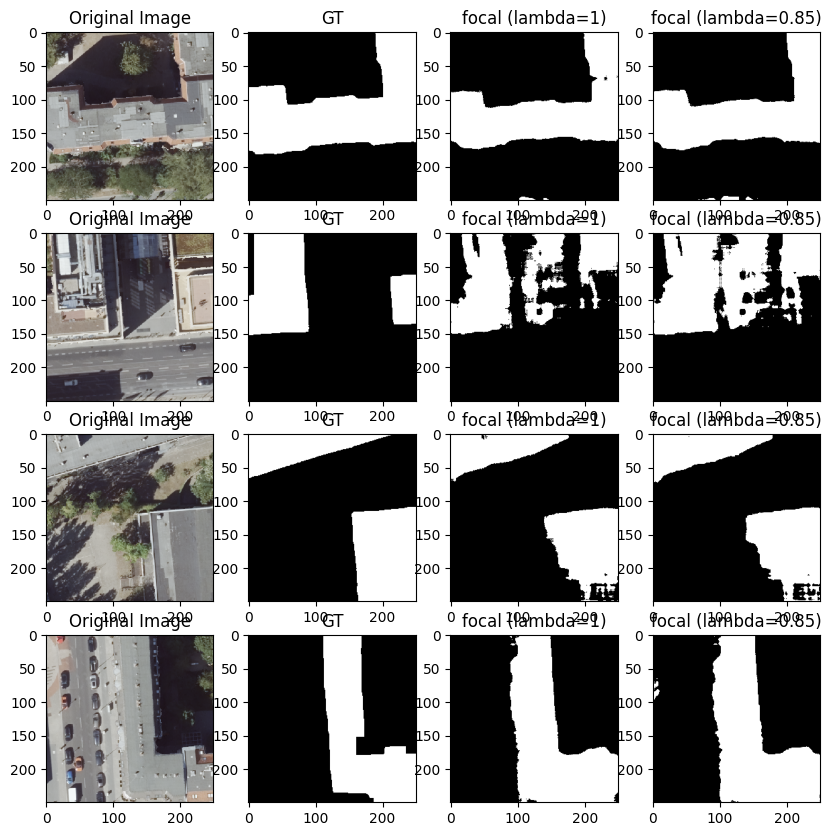

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(10, 10))

mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

for i in range(4):
    random_img = int(np.random.uniform(0,57))
    img, gt = test_dataset[random_img]
    mask1 = predict_one(unet_model_v2_focal, img.unsqueeze(0))
    mask2 = predict_one(unet_model_v2_focal_0_85, img.unsqueeze(0))
    orig_img = CenterCrop(size=[250, 250])(img)
    orig_img = orig_img.cpu().detach().numpy().transpose((1, 2, 0))
    orig_img = std * orig_img + mean
    orig_img = np.clip(orig_img, 0, 1)
    mask_gt = gt.cpu().detach().numpy().squeeze()
    mask_gt = mask_gt > 0.5
    axes[i,0].imshow(orig_img);
    axes[i,0].set_title("Original Image")

    axes[i,1].imshow(mask_gt, cmap='gray')
    axes[i,1].set_title("GT")

    axes[i,2].imshow(mask1, cmap='gray')
    axes[i,2].set_title("focal (lambda=1)")

    axes[i,3].imshow(mask2, cmap='gray')
    axes[i,3].set_title("focal (lambda=0.85)")

plt.show()


## Эксперимент v2_focal_0_85_1

Качество модели все же можно улучшить. Можно заметить, что при сохранении модели, сохраняется и оптимайзер. А вместе с ним сохраняется текущий на конец обучения lr=2e-05. Попробуем еще раз дообучить модель v2 (16 эпох) при lamda=0.85, но установим lr=1е-4.

In [ ]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)
batch_size = 8
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True, persistent_workers=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)

Found 10199 images for train part
Found 2550 images for val part


In [ ]:
unet_model_v2 = UNet().to(DEVICE)
checkpoints_v2 = torch.load(BASE_DIR.joinpath('best_iou_v2.pt'), map_location=DEVICE)
unet_model_v2.load_state_dict(checkpoints_v2['model_state_dict'])

for param in unet_model_v2.encoder1.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder2.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder3.parameters():
    param.requires_grad = False
for param in unet_model_v2.encoder4.parameters():
    param.requires_grad = False
for param in unet_model_v2.bottleneck.parameters():
    param.requires_grad = False

optimizer_v2 = torch.optim.Adam(unet_model_v2.parameters(), lr=1e-4)
optimizer_v2.load_state_dict(checkpoints_v2['optimizer_state_dict'])
for param_group in optimizer_v2.param_groups:
    param_group['lr'] = 1e-4
optimizer_v2


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)

epoch:   0%|          | 0/6 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.1287 eval_loss: 0.1276 eval_iou: 0.7430


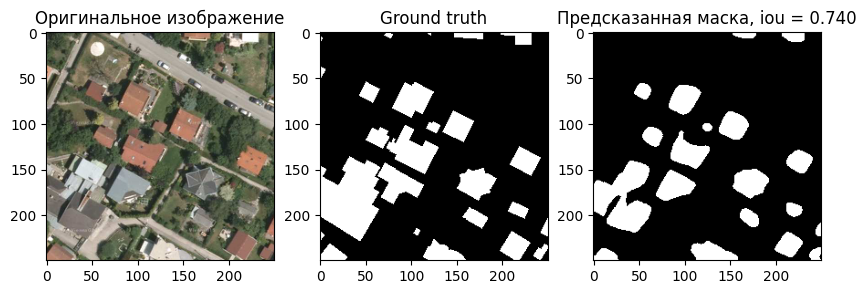


Epoch: 002 train_loss: 0.1280 eval_loss: 0.1283 eval_iou: 0.7403


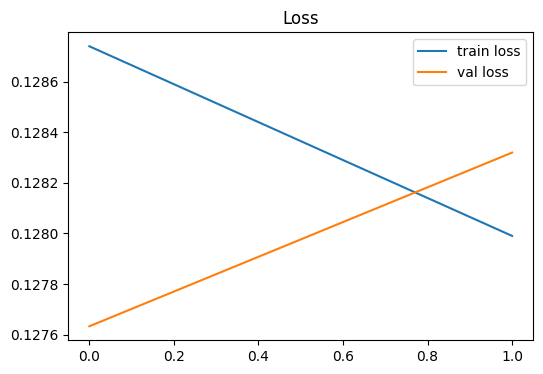


Epoch: 003 train_loss: 0.1280 eval_loss: 0.1280 eval_iou: 0.7402


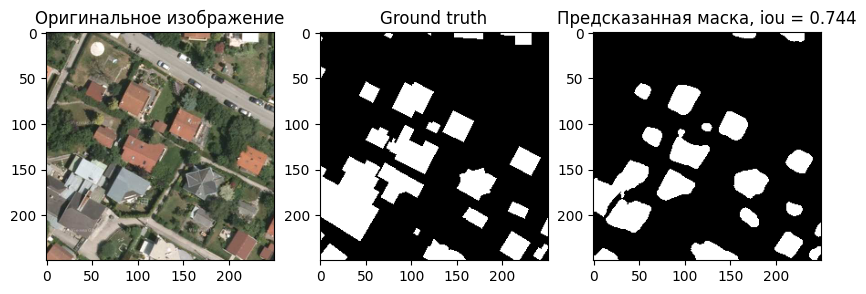


Epoch: 004 train_loss: 0.1278 eval_loss: 0.1269 eval_iou: 0.7441


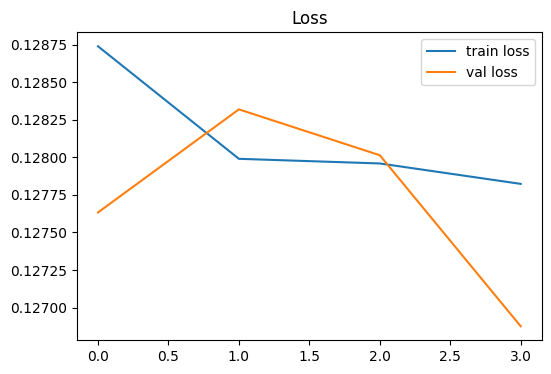


Epoch: 005 train_loss: 0.1270 eval_loss: 0.1273 eval_iou: 0.7440


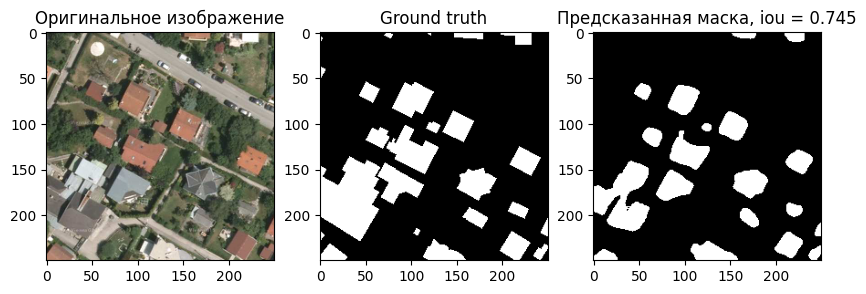


Epoch: 006 train_loss: 0.1266 eval_loss: 0.1260 eval_iou: 0.7454


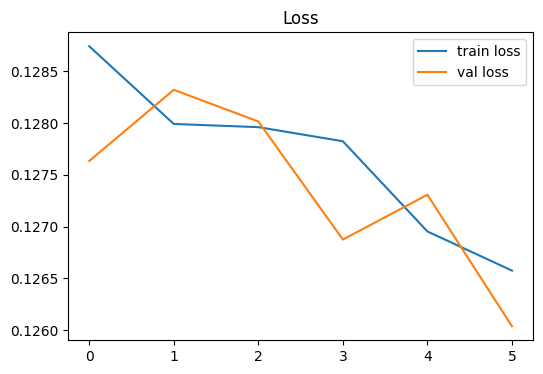

Training complete in 67m 37s


In [ ]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_v2, mode='min', factor=0.2, patience=2)
criterion = focal_loss_0_85
epochs = 6
unet_checkpoints_delta_0_45_1_focal_0_85 = BASE_DIR.joinpath('unet_checkpoints_delta_0_45_1_focal_0_85')
unet_checkpoints_delta_0_45_1_focal_0_85.mkdir(exist_ok=True)
unet_history_train_delta_0_45_1_focal_0_85 = train(unet_model_v2, train_dataloader, valid_dataloader, epochs, criterion, optimizer_v2, ckpt_path=unet_checkpoints_delta_0_45_1_focal_0_85, scheduler=scheduler, plot_loss = True)

### Проверка на тестовых данных

In [ ]:
url = 'https://drive.google.com/uc?id=1v_d0zQZgCnUPEwNrBV0BMBFikRkCrf6S'
output = 'best_iou_v2_focal_0_85_1.pt'
gdown.download(url, output)

Downloading...
From (original): https://drive.google.com/uc?id=1v_d0zQZgCnUPEwNrBV0BMBFikRkCrf6S
From (redirected): https://drive.google.com/uc?id=1v_d0zQZgCnUPEwNrBV0BMBFikRkCrf6S&confirm=t&uuid=13fe2b59-1bb0-4179-8cea-01c3686f50ed
To: /kaggle/working/best_iou_v2_focal_0_85_1.pt
100%|██████████| 373M/373M [00:03<00:00, 116MB/s]  


'best_iou_v2_focal_0_85_1.pt'

In [ ]:
unet_model_v2_focal_0_85_1 = UNet().to(DEVICE)
checkpoints_v2_focal_0_85_1 = torch.load(BASE_DIR.joinpath('best_iou_v2_focal_0_85_1.pt'), map_location=DEVICE)
unet_model_v2_focal_0_85_1.load_state_dict(checkpoints_v2_focal_0_85_1['model_state_dict'])
best_epoch_v2_focal_0_85_1 = checkpoints_v2_focal_0_85_1['epoch']

unet_model_v2 = UNet().to(DEVICE)
checkpoints_v2 = torch.load(BASE_DIR.joinpath('best_iou_v2.pt'), map_location=DEVICE)
unet_model_v2.load_state_dict(checkpoints_v2['model_state_dict'])
best_epoch_v2 = checkpoints_v2['epoch']

In [ ]:
data = {
  "IoU": [0, 0, 0, 0],
  "Dice": [0, 0, 0, 0],
  "Precision": [0, 0, 0, 0],
  "Recall": [0, 0, 0, 0]
}
data["IoU"][0], data["Dice"][0], data["Precision"][0], data["Recall"][0] = test(unet_model_v2_focal, test_dataloader)
data["IoU"][1], data["Dice"][1], data["Precision"][1], data["Recall"][1] = test(unet_model_v2_focal_0_85, test_dataloader)
data["IoU"][2], data["Dice"][2], data["Precision"][2], data["Recall"][2] = test(unet_model_v2_focal_0_85_1, test_dataloader)
data["IoU"][3], data["Dice"][3], data["Precision"][3], data["Recall"][3] = test(unet_model_v2, test_dataloader)


df_metrics = pd.DataFrame(data, index=['focal (lamda=1)','focal (lamda=0.85)', 'focal (lamda=0.85, lr=1e-4)', 'v2'])
df_metrics

,IoU,Dice,Precision,Recall
focal (lamda=1),0.712521,0.816807,0.793207,0.890247
focal (lamda=0.85),0.711309,0.816552,0.772433,0.915074
"focal (lamda=0.85, lr=1e-4)",0.718109,0.821252,0.789574,0.904220
v2,0.712176,0.816056,0.783660,0.901844


In [ ]:
print(f"Количетво эпох обучения текущей модели: {best_epoch_v2+best_epoch_v2_focal_0_85_1}")

Количетво эпох обучения текущей модели: 22


## Эксперимент v2_focal_0_85_1_1

Дообучение v2_focal_0_85_1 еще на 8 эпох

In [ ]:
for param in unet_model_v2_focal_0_85_1.encoder1.parameters():
    param.requires_grad = False
for param in unet_model_v2_focal_0_85_1.encoder2.parameters():
    param.requires_grad = False
for param in unet_model_v2_focal_0_85_1.encoder3.parameters():
    param.requires_grad = False
for param in unet_model_v2_focal_0_85_1.encoder4.parameters():
    param.requires_grad = False
for param in unet_model_v2_focal_0_85_1.bottleneck.parameters():
    param.requires_grad = False

optimizer_v2_focal_0_85_1 = torch.optim.Adam(unet_model_v2_focal_0_85_1.parameters(), lr=1e-4)
optimizer_v2_focal_0_85_1.load_state_dict(checkpoints_v2_focal_0_85_1['optimizer_state_dict'])
optimizer_v2_focal_0_85_1

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)

In [ ]:
train_dataset = GeodataDataset(train_files, img_path=TRAIN_IMG_DIR, mode='train', transforms=train_transform, gt_path=TRAIN_GT_DIR)
val_dataset = GeodataDataset(val_files, img_path=TRAIN_IMG_DIR, mode='val', transforms=test_transform, gt_path=TRAIN_GT_DIR)
batch_size = 8
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True, persistent_workers=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True, persistent_workers=True)

Found 10199 images for train part
Found 2550 images for val part


epoch:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch: 001 train_loss: 0.1270 eval_loss: 0.1273 eval_iou: 0.7473


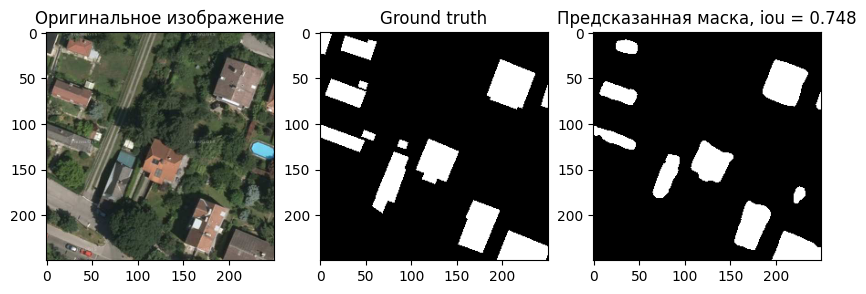


Epoch: 002 train_loss: 0.1266 eval_loss: 0.1241 eval_iou: 0.7481


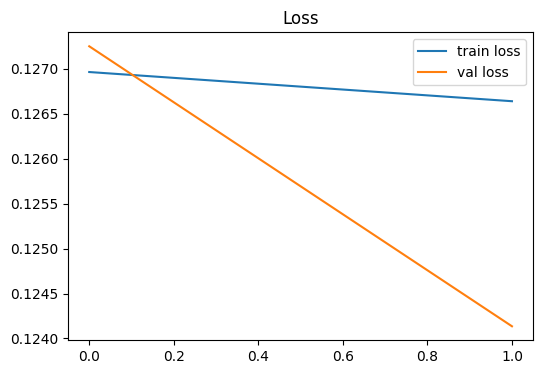


Epoch: 003 train_loss: 0.1265 eval_loss: 0.1237 eval_iou: 0.7509


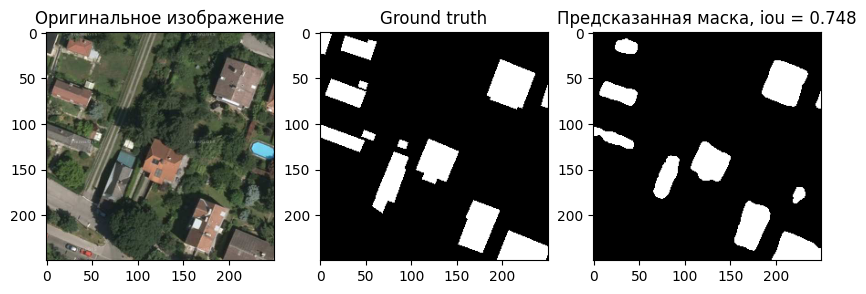


Epoch: 004 train_loss: 0.1262 eval_loss: 0.1255 eval_iou: 0.7477


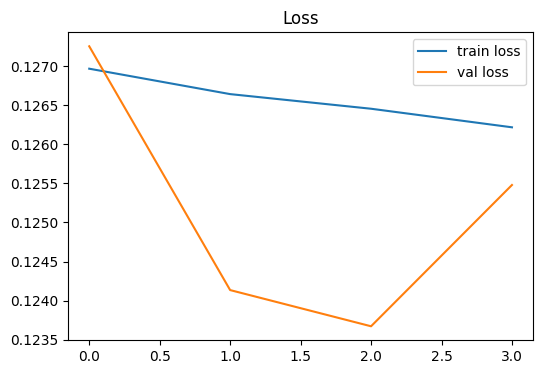


Epoch: 005 train_loss: 0.1259 eval_loss: 0.1232 eval_iou: 0.7484


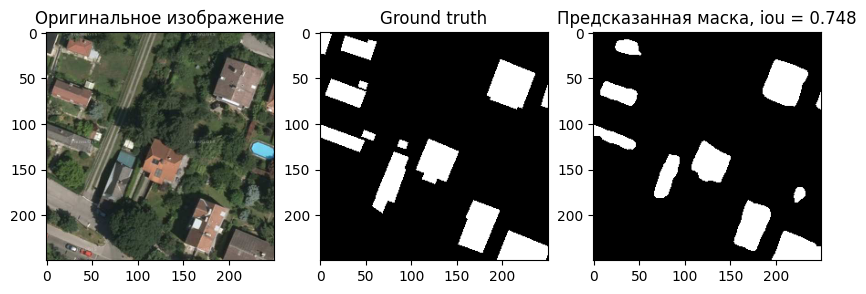


Epoch: 006 train_loss: 0.1256 eval_loss: 0.1237 eval_iou: 0.7482


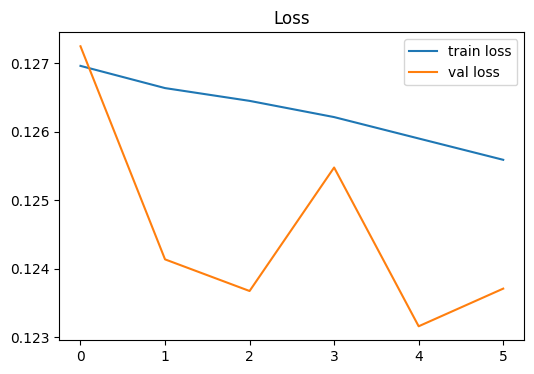


Epoch: 007 train_loss: 0.1259 eval_loss: 0.1232 eval_iou: 0.7495


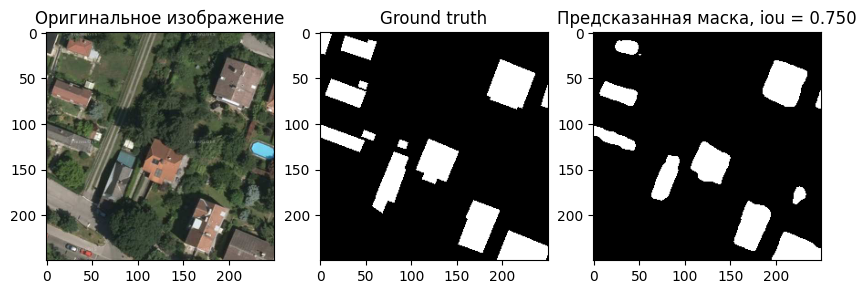


Epoch: 008 train_loss: 0.1252 eval_loss: 0.1238 eval_iou: 0.7498


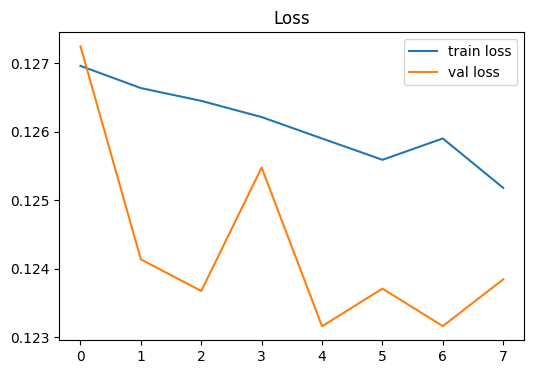


Epoch: 009 train_loss: 0.1234 eval_loss: 0.1217 eval_iou: 0.7510


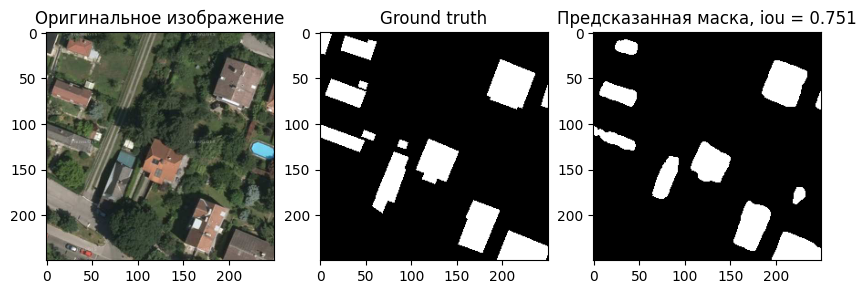


Epoch: 010 train_loss: 0.1234 eval_loss: 0.1217 eval_iou: 0.7508


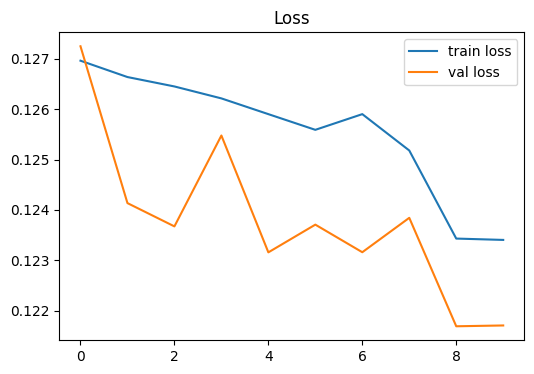

Training complete in 102m 23s


In [ ]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_v2_focal_0_85_1, mode='min', factor=0.2, patience=2)
criterion = focal_loss_0_85
epochs = 10
unet_checkpoints_delta_focal_0_85 = BASE_DIR.joinpath('unet_checkpoints_delta_focal_0_85')
unet_checkpoints_delta_focal_0_85.mkdir(exist_ok=True)
unet_history_train_delta_focal_0_85 = train(unet_model_v2_focal_0_85_1, train_dataloader, valid_dataloader, epochs, criterion, optimizer_v2_focal_0_85_1, ckpt_path=unet_checkpoints_delta_focal_0_85, scheduler=scheduler, plot_loss = True)

### Проверка на тестовых данных

In [ ]:
url = 'https://drive.google.com/uc?id=1ZsYl7nvXTAx-6r3pK1wOwPdtUKrSfpDy'
output = 'best_iou_v2_focal_0_85_1_1.pt'
gdown.download(url, output)

Downloading...
From (original): https://drive.google.com/uc?id=1ZsYl7nvXTAx-6r3pK1wOwPdtUKrSfpDy
From (redirected): https://drive.google.com/uc?id=1ZsYl7nvXTAx-6r3pK1wOwPdtUKrSfpDy&confirm=t&uuid=776463b4-d786-408f-a811-5c88fad7c60f
To: /kaggle/working/best_iou_v2_focal_0_85_1_1.pt
100%|██████████| 373M/373M [00:02<00:00, 135MB/s]  


'best_iou_v2_focal_0_85_1_1.pt'

In [ ]:
unet_model_v2_focal_0_85_1_1 = UNet().to(DEVICE)
checkpoints_v2_focal_0_85_1_1 = torch.load(BASE_DIR.joinpath('best_iou_v2_focal_0_85_1_1.pt'), map_location=DEVICE)
unet_model_v2_focal_0_85_1_1.load_state_dict(checkpoints_v2_focal_0_85_1_1['model_state_dict'])
best_epoch_v2_focal_0_85_1_1 = checkpoints_v2_focal_0_85_1_1['epoch']

In [ ]:
print(f"Лучшее качетсво на данном этапе обучения на эпохе: {best_epoch_v2_focal_0_85_1_1}")

Лучшее качетсво на данном этапе обучения на эпохе: 9


In [ ]:
print(f"Количетво эпох обучения текущей модели: {best_epoch_v2+best_epoch_v2_focal_0_85_1+best_epoch_v2_focal_0_85_1_1}")

Количетво эпох обучения текущей модели: 31


In [ ]:
data = {
  "IoU": [0, 0, 0],
  "Dice": [0, 0, 0],
  "Precision": [0, 0, 0],
  "Recall": [0, 0, 0]
}
data["IoU"][0], data["Dice"][0], data["Precision"][0], data["Recall"][0] = test(unet_model_v2, test_dataloader)
data["IoU"][1], data["Dice"][1], data["Precision"][1], data["Recall"][1] = test(unet_model_v2_focal_0_85_1, test_dataloader)
data["IoU"][2], data["Dice"][2], data["Precision"][2], data["Recall"][2] = test(unet_model_v2_focal_0_85_1_1, test_dataloader)

df_metrics = pd.DataFrame(data, index=['16 эпох', '22 эпохи', '31 эпоха'])
df_metrics

,IoU,Dice,Precision,Recall
16 эпох,0.712176,0.816056,0.783660,0.901844
22 эпохи,0.718109,0.821252,0.789574,0.904220
31 эпоха,0.719315,0.821677,0.805454,0.885341


Таким образом имеем:

 1) модель v2, обучена до 16 эпохи

 2) модель v2_focal_0_85_1 - дообученная модель v2 до 22 эпох с измененным параметром lamda=0.85 в Unified Focal Loss и переназначенным lr=1e-4

 3) модель v2_focal_0_85_1_1 - дообученная модель v2_focal_0_85_1 до 31 эпохи

 При дальнейшем обучении с 22 до 31 эпохи увеличивается Precision, но Recall начинает падать. При этом разница между IoU и Dice на 22 и 31 эпохах незначительна.

 Посмотрим визуально на предсказания.

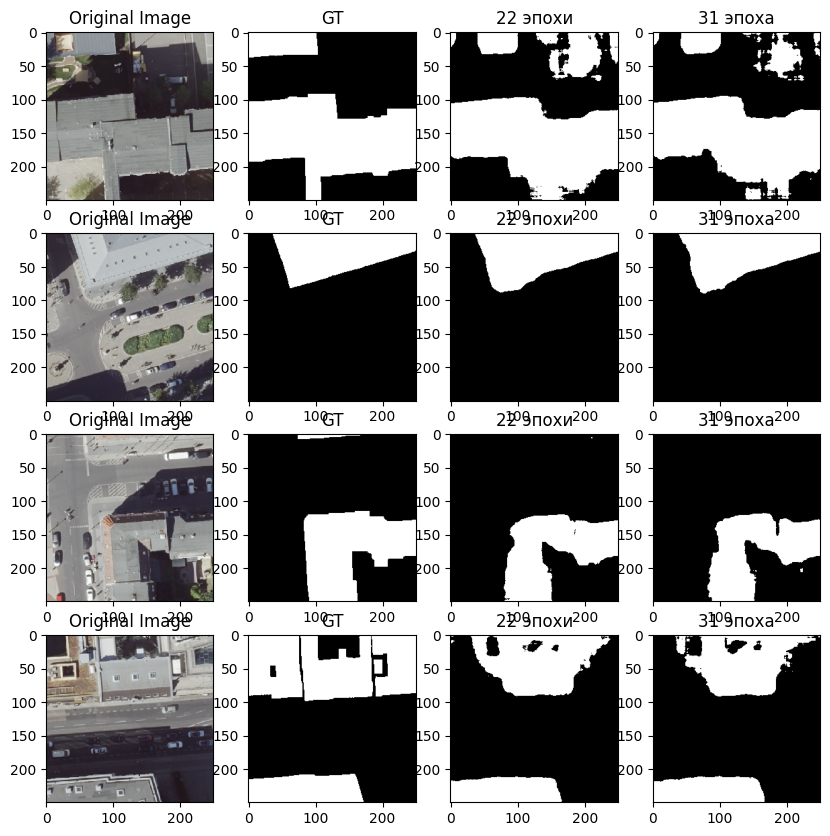

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(10, 10))

mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

for i in range(4):
    random_img = int(np.random.uniform(0,57))
    img, gt = test_dataset[random_img]
    mask1 = predict_one(unet_model_v2_focal_0_85_1, img.unsqueeze(0))
    mask2 = predict_one(unet_model_v2_focal_0_85_1_1, img.unsqueeze(0))
    orig_img = CenterCrop(size=[250, 250])(img)
    orig_img = orig_img.cpu().detach().numpy().transpose((1, 2, 0))
    orig_img = std * orig_img + mean
    orig_img = np.clip(orig_img, 0, 1)
    mask_gt = gt.cpu().detach().numpy().squeeze()
    mask_gt = mask_gt > 0.5
    axes[i,0].imshow(orig_img);
    axes[i,0].set_title("Original Image")

    axes[i,1].imshow(mask_gt, cmap='gray')
    axes[i,1].set_title("GT")

    axes[i,2].imshow(mask1, cmap='gray')
    axes[i,2].set_title("22 эпохи")

    axes[i,3].imshow(mask2, cmap='gray')
    axes[i,3].set_title("31 эпоха")

plt.show()

Визуально оценить сложно. Остановимся на 22 эпохах, т.е. на версии v2_focal_0_85_1.